# Forecasting hourly Indoor air pollutant concentration



In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import lightgbm as lgb
import xgboost as xgb
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from keras.models import Sequential
from keras.layers import Dense, LSTM, SimpleRNN
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso

## Load data

In [18]:
# Load data (we created this file in the previous notebook)

data = pd.read_csv(
    "gams_preprocessed_hourly.csv",
    parse_dates=["ts"],
    index_col=["ts"],
)

data.head()

,co2,humidity,pm10,pm25,temperature,voc,Month,Week,Day,Day_of_week,...,pm10_window,pm25_window,temperature_window,voc_window,Month_sin,Month_cos,Hour_sin,Hour_cos,Day_sin,Day_cos
ts,,,,,,,,,,,,,,,,,,,,,
2016-11-22 00:00:00,0.125142,0.681239,0.022233,0.033495,0.592737,0.000287,11,47,22,1,...,0.026882,0.041626,0.624210,0.000309,-0.5,0.866025,0.000000,1.000000,-0.968077,-0.250653
2016-11-22 01:00:00,0.159592,0.659048,0.006791,0.007556,0.613171,0.000258,11,47,22,1,...,0.028853,0.044576,0.607663,0.000319,-0.5,0.866025,0.269797,0.962917,-0.968077,-0.250653
2016-11-22 02:00:00,0.316681,0.633366,0.008445,0.009361,0.645052,0.000405,11,47,22,1,...,0.023795,0.036160,0.604318,0.000239,-0.5,0.866025,0.519584,0.854419,-0.968077,-0.250653
2016-11-22 03:00:00,0.443831,0.611913,0.018425,0.024901,0.666608,0.000563,11,47,22,1,...,0.012489,0.016804,0.616987,0.000317,-0.5,0.866025,0.730836,0.682553,-0.968077,-0.250653
2016-11-22 04:00:00,0.532989,0.624371,0.025304,0.033161,0.695313,0.011083,11,47,22,1,...,0.011220,0.013939,0.641610,0.000409,-0.5,0.866025,0.887885,0.460065,-0.968077,-0.250653


## Separate into train and test

We will train the model on a certain portion of the data and leave another part out to evaluate the model.

Because these are time series, I will split based on time. We leave the most recent data as test set.

In [19]:
# Find minimum and maximum dates.

data.index.min(), data.index.max()

(Timestamp('2016-11-22 00:00:00'), Timestamp('2017-03-28 09:00:00'))

In [20]:
# We will keep the last month of data to test(March 2017)
# the forecasting models.

X_train = data[data.index <= "2017-03-01"]
X_test = data[data.index > "2017-03-01"]

X_train.shape, X_test.shape

((2270, 36), (657, 36))

In [21]:
# the target variable
y_train = X_train["co2"].copy()
y_test = X_test["co2"].copy()

# remove raw time series from predictors set
X_train = X_train.drop("co2", axis=1)
X_test = X_test.drop("co2", axis=1)

In [22]:
p=['co2', 'humidity', 'pm10', 'pm25', 'temperature', 'voc']

def return_train_data(data,feature):
    X_train = data[data.index <= "2017-03-01"]
    X_test = data[data.index > "2017-03-01"]
    y_train = X_train[feature].copy()
    y_test = X_test[feature].copy()

    # remove raw time series from predictors set
    X_train = X_train.drop(feature, axis=1)
    X_test = X_test.drop(feature, axis=1)
    return X_train, y_train, X_test, y_test,feature





# LIGHT GBM

In [8]:
def lightgbm_regression(X_train, y_train, X_test, y_test,feature):
    # Define model and parameter grid for LightGBM
    model = lgb.LGBMRegressor()
    param_grid = {
        'num_leaves': [70,90,120,150,300,500],
        'learning_rate': [0.01, 0.05, 0.1],
        'n_estimators': [150,300,450,600],
    }

    # Perform grid search with cross-validation
    print("Performing grid search for LightGBM...")
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               cv=5, n_jobs=-1, scoring='neg_mean_squared_error',verbose=3)
    grid_search.fit(X_train, y_train)
    print(f"Best hyperparameters found: {grid_search.best_params_}")

    # Make predictions on train and test data and calculate MSE and MAPE
    y_train_pred = grid_search.predict(X_train)
    mse_train = mean_squared_error(y_train, y_train_pred)
    mape_train = mean_absolute_percentage_error(y_train, y_train_pred)
    y_pred = grid_search.predict(X_test)
    mse_test = mean_squared_error(y_test, y_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_pred) 

    # Plot predictions vs actual values on hourly timeline
    fig = plt.figure(figsize=(8,6))
    plt.plot(y_test.index, y_test.values)
    plt.plot(y_test.index, y_pred)
    plt.legend(['Actual', 'Predicted'])
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(f'LightGBM Predictions vs Actual Values (Hourly) for {feature}')
    plt.rcParams['figure.dpi'] = 300
    fig.savefig(f"./Plots/{feature}_lightgbm.pdf", dpi=300, bbox_inches='tight')
    plt.show()

    print(f"LightGBM Training MSE: {mse_train:.9f}")
    print(f"LightGBM Training MAPE: {mape_train:.9f}%")
    print(f"LightGBM Testing MSE: {mse_test:.9f}")
    print(f"LightGBM Testing MAPE: {mape_test:.9f}%")

    return (mse_train, mse_test, mape_train, mape_test)



# XGBOOST

In [9]:
def xgboost_regression(X_train, y_train, X_test, y_test,feature):
    # Define model and parameter grid for XGBoost
    model = xgb.XGBRegressor()
    param_grid = {
        'max_depth': [7,9, 11,],
        'learning_rate': [0.01, 0.05, 0.1],
        'n_estimators': [150,300,450],
    
        
    }

    # Perform grid search with cross-validation
    print("Performing grid search for XGBoost...")
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               cv=5, n_jobs=-1, scoring='neg_mean_squared_error',verbose=2)
    grid_search.fit(X_train, y_train)
    print(f"Best hyperparameters found: {grid_search.best_params_}")

    # Make predictions on train and test data and calculate MSE and MAPE
    y_train_pred = grid_search.predict(X_train)
    mse_train = mean_squared_error(y_train, y_train_pred)
    mape_train = mean_absolute_percentage_error(y_train, y_train_pred)
    y_pred = grid_search.predict(X_test)
    mse_test = mean_squared_error(y_test, y_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_pred)

    # Plot predictions vs actual values on hourly timeline
    fig = plt.figure(figsize=(8,6))
    plt.plot(y_test.index, y_test.values)
    plt.plot(y_test.index, y_pred)
    plt.legend(['Actual', 'Predicted'])
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(f'XGBoost Predictions vs Actual Values (Hourly) for {feature}')
    plt.rcParams['figure.dpi'] = 300
    fig.savefig(f"./Plots/{feature}_XGBoost.pdf", dpi=300, bbox_inches='tight')
    plt.show()

    print(f"LightGBM Training MSE: {mse_train:.9f}")
    print(f"LightGBM Training MAPE: {mape_train:.9f}%")
    print(f"LightGBM Testing MSE: {mse_test:.9f}")
    print(f"LightGBM Testing MAPE: {mape_test:.9f}%")
    return (mse_train, mse_test, mape_train, mape_test)


# Random Forest

In [10]:
def random_forest_regression(X_train, y_train, X_test, y_test,feature):
    # Define model and parameter grid for Random Forest
    model = RandomForestRegressor()
    param_grid = {
        'n_estimators': [150,300,450],
    
        'max_depth': [ 40, 60,100]
        
    }
    
    # Perform grid search with cross-validation
    print("Performing grid search for Random Forest...")
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               cv=5, n_jobs=-1, scoring='neg_mean_squared_error',verbose=2)
    grid_search.fit(X_train, y_train)
    print(f"Best hyperparameters found: {grid_search.best_params_}")

    # Make predictions on train and test data and calculate MSE and MAPE
    y_train_pred = grid_search.predict(X_train)
    mse_train = mean_squared_error(y_train, y_train_pred)
    mape_train = mean_absolute_percentage_error(y_train, y_train_pred)
    y_pred = grid_search.predict(X_test)
    mse_test = mean_squared_error(y_test, y_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_pred)
     # Plot predictions vs actual values on hourly timeline
    fig = plt.figure(figsize=(8,6))
    plt.plot(y_test.index, y_test.values)
    plt.plot(y_test.index, y_pred)
    plt.legend(['Actual', 'Predicted'])
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(f'Random Forest Predictions vs Actual Values (Hourly) for {feature}')
    plt.rcParams['figure.dpi'] = 300
    fig.savefig(f"./Plots/{feature}_randomforest.pdf", dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Random Forest Training MSE: {mse_train:.9f}")
    print(f"Random Forest Training MAPE: {mape_train:.9f}%")
    print(f"Random Forest Testing MSE: {mse_test:.9f}")
    print(f"Random Forest Testing MAPE: {mape_test:.9f}%")
    return (mse_train, mse_test, mape_train, mape_test)




## KNN

In [11]:
def knn_regression(X_train, y_train, X_test, y_test,feature):
    # Define model and parameter grid for KNN
    model = KNeighborsRegressor()
    param_grid = {
        'n_neighbors': [3, 5, 7, 9,],
        'weights': ['uniform', 'distance'],
        'p': [1, 2,5]
    }

    # Perform grid search with cross-validation
    print("Performing grid search for KNN...")
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               cv=5, n_jobs=-1, scoring='neg_mean_squared_error',verbose=2)
    grid_search.fit(X_train, y_train)
    print(f"Best hyperparameters found: {grid_search.best_params_}")

    # Make predictions on train and test data and calculate MSE and MAPE
    y_train_pred = grid_search.predict(X_train)
    mse_train = mean_squared_error(y_train, y_train_pred)
    mape_train = mean_absolute_percentage_error(y_train, y_train_pred)
    y_pred = grid_search.predict(X_test)
    mse_test = mean_squared_error(y_test, y_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_pred)
    # Plot predictions vs actual values on hourly timeline
    fig = plt.figure(figsize=(8,6))
    plt.plot(y_test.index, y_test.values)
    plt.plot(y_test.index, y_pred)
    plt.legend(['Actual', 'Predicted'])
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(f'KNN Regressor Predictions vs Actual Values (Hourly) for {feature}')
    plt.rcParams['figure.dpi'] = 300
    fig.savefig(f"./Plots/{feature}_KNN.pdf", dpi=300, bbox_inches='tight')
    plt.show()

    print(f"KNN Regressor Training MSE: {mse_train:.9f}")
    print(f"KNN Regressor Training MAPE: {mape_train:.9f}%")
    print(f"KNN Regressor Testing MSE: {mse_test:.9f}")
    print(f"KNN Regressor Testing MAPE: {mape_test:.9f}%")
    return (mse_train, mse_test, mape_train, mape_test)


# SVR

In [12]:
def svr_regression(X_train, y_train, X_test, y_test,feature):
    # Define model and parameter grid for Support Vector Regressor (SVR)
    model = SVR()
    param_grid = {
        'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
        'C': [0.1, 1, 10, 100],
        'epsilon': [0.01, 0.1, 1]
    }

    # Perform grid search with cross-validation
    print("Performing grid search for SVR...")
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               cv=5, n_jobs=-1, scoring='neg_mean_squared_error',verbose=2)
    grid_search.fit(X_train, y_train)
    print(f"Best hyperparameters found: {grid_search.best_params_}")

    # Make predictions on train and test data and calculate MSE and MAPE
    y_train_pred = grid_search.predict(X_train)
    mse_train = mean_squared_error(y_train, y_train_pred)
    mape_train = mean_absolute_percentage_error(y_train, y_train_pred)
    y_pred = grid_search.predict(X_test)
    mse_test = mean_squared_error(y_test, y_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_pred)
     # Plot predictions vs actual values on hourly timeline
    fig = plt.figure(figsize=(8,6))
    plt.plot(y_test.index, y_test.values)
    plt.plot(y_test.index, y_pred)
    plt.legend(['Actual', 'Predicted'])
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(f'Support Vector Regressor Predictions vs Actual Values (Hourly) for {feature}')
    plt.rcParams['figure.dpi'] = 300
    fig.savefig(f"./Plots/{feature}_SVR.pdf", dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Support Vector Regressor Training MSE: {mse_train:.9f}")
    print(f"Support Vector Regressor Training MAPE: {mape_train:.9f}%")
    print(f"Support Vector Regressor Testing MSE: {mse_test:.9f}")
    print(f"Support Vector Regressor Testing MAPE: {mape_test:.9f}%")
    return (mse_train, mse_test, mape_train, mape_test)




# DTR

In [13]:
def decision_tree_regression(X_train, y_train, X_test, y_test,feature):
    # Define model and parameter grid for Decision Tree
    model = DecisionTreeRegressor()
    param_grid = {
        'max_depth': [3, 5, 7,13, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4,8]
    }

    # Perform grid search with cross-validation
    print("Performing grid search for Decision Tree...")
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               cv=5, n_jobs=-1, scoring='neg_mean_squared_error',verbose=2)
    grid_search.fit(X_train, y_train)
    print(f"Best hyperparameters found: {grid_search.best_params_}")

    # Make predictions on train and test data and calculate MSE and MAPE
    y_train_pred = grid_search.predict(X_train)
    mse_train = mean_squared_error(y_train, y_train_pred)
    mape_train = mean_absolute_percentage_error(y_train, y_train_pred)
    y_pred = grid_search.predict(X_test)
    mse_test = mean_squared_error(y_test, y_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_pred)
     # Plot predictions vs actual values on hourly timeline
    fig = plt.figure(figsize=(8,6))
    plt.plot(y_test.index, y_test.values)
    plt.plot(y_test.index, y_pred)
    plt.legend(['Actual', 'Predicted'])
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(f'Decisionn Tree vs Actual Values (Hourly){feature}')
    plt.rcParams['figure.dpi'] = 300
    fig.savefig(f"./Plots/{feature}_DTR.pdf", dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Decisionn Tree Training MSE: {mse_train:.9f}")
    print(f"Decisionn Tree Training MAPE: {mape_train:.9f}%")
    print(f"Decisionn Tree Testing MSE: {mse_test:.9f}")
    print(f"Decisionn Tree Testing MAPE: {mape_test:.9f}%")
    return (mse_train, mse_test, mape_train, mape_test)





## Linear Regression

In [14]:
def lasso_regression(X_train, y_train, X_test, y_test,feature):
    # Define model and parameter grid for Lasso Regression
    model = Lasso()
    param_grid = {
        'alpha': [0.001, 0.01, 0.1, 1, 10],
        'fit_intercept': [True, False]
    }

    # Perform grid search with cross-validation
    print("Performing grid search for Lasso Regression...")
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               cv=5, n_jobs=-1, scoring='neg_mean_squared_error',verbose=3)
    grid_search.fit(X_train, y_train)
    print(f"Best hyperparameters found: {grid_search.best_params_}")

    # Make predictions on train and test data and calculate MSE and MAPE
    y_train_pred = grid_search.predict(X_train)
    mse_train = mean_squared_error(y_train, y_train_pred)
    mape_train = mean_absolute_percentage_error(y_train, y_train_pred)
    y_pred = grid_search.predict(X_test)
    mse_test = mean_squared_error(y_test, y_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_pred)

    # Plot predictions vs actual values on hourly timeline
    fig = plt.figure(figsize=(8,6))
    plt.plot(y_test.index, y_test.values)
    plt.plot(y_test.index, y_pred)
    plt.legend(['Actual', 'Predicted'])
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(f'Lasso Regression Predictions vs Actual Values (Hourly) for {feature}')
    plt.rcParams['figure.dpi'] = 300
    fig.savefig(f"./Plots/{feature}_lasso.pdf", dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Lasso Regression Training MSE: {mse_train:.9f}")
    print(f"Lasso Regression Training MAPE: {mape_train:.9f}%")
    print(f"Lasso Regression Testing MSE: {mse_test:.9f}")
    print(f"Lasso Regression Testing MAPE: {mape_test:.9f}%")
    
    return (mse_train, mse_test, mape_train, mape_test)


## LSTM

In [15]:
def lstm_regression(X_train, y_train, X_test, y_test,feature):
    # Reshape training and testing data to be 3D for LSTM
    X_train = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

    # Define model architecture for LSTM
    model = Sequential()
    model.add(LSTM(1024, activation='relu', input_shape=(1, X_train.shape[2])))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    # Train the model
    model.fit(X_train, y_train, epochs=100, batch_size=1024, verbose=1,use_multiprocessing=True,workers=-1)

    # Make predictions on train and test data and calculate MSE and MAPE
    y_train_pred = model.predict(X_train).flatten()
    mse_train = mean_squared_error(y_train, y_train_pred)
    mape_train = mean_absolute_percentage_error(y_train, y_train_pred)
    y_pred = model.predict(X_test).flatten()
    mse_test = mean_squared_error(y_test, y_pred)
    mape_test = mean_absolute_percentage_error(y_test, y_pred)

     # Plot predictions vs actual values on hourly timeline
    fig = plt.figure(figsize=(8,6))
    plt.plot(y_test.index, y_test.values)
    plt.plot(y_test.index, y_pred)
    plt.legend(['Actual', 'Predicted'])
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(f'LSTM Predictions vs Actual Values (Hourly) for {feature}')
    plt.rcParams['figure.dpi'] = 300
    fig.savefig(f"./Plots/{feature}_Lstm.pdf", dpi=300, bbox_inches='tight')
    plt.show()

    print(f"LSTM Training MSE: {mse_train:.9f}")
    print(f"LSTM Training MAPE: {mape_train:.9f}%")
    print(f"LSTM Testing MSE: {mse_test:.9f}")
    print(f"LSTM Testing MAPE: {mape_test:.9f}%")

    return (mse_train, mse_test, mape_train, mape_test)


Performing grid search for LightGBM...
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best hyperparameters found: {'learning_rate': 0.05, 'n_estimators': 300, 'num_leaves': 90}


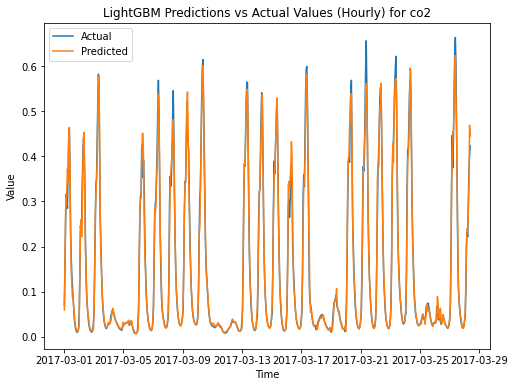

LightGBM Training MSE: 0.000015779
LightGBM Training MAPE: 0.014397765%
LightGBM Testing MSE: 0.000383429
LightGBM Testing MAPE: 0.096032540%
Performing grid search for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best hyperparameters found: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 450}


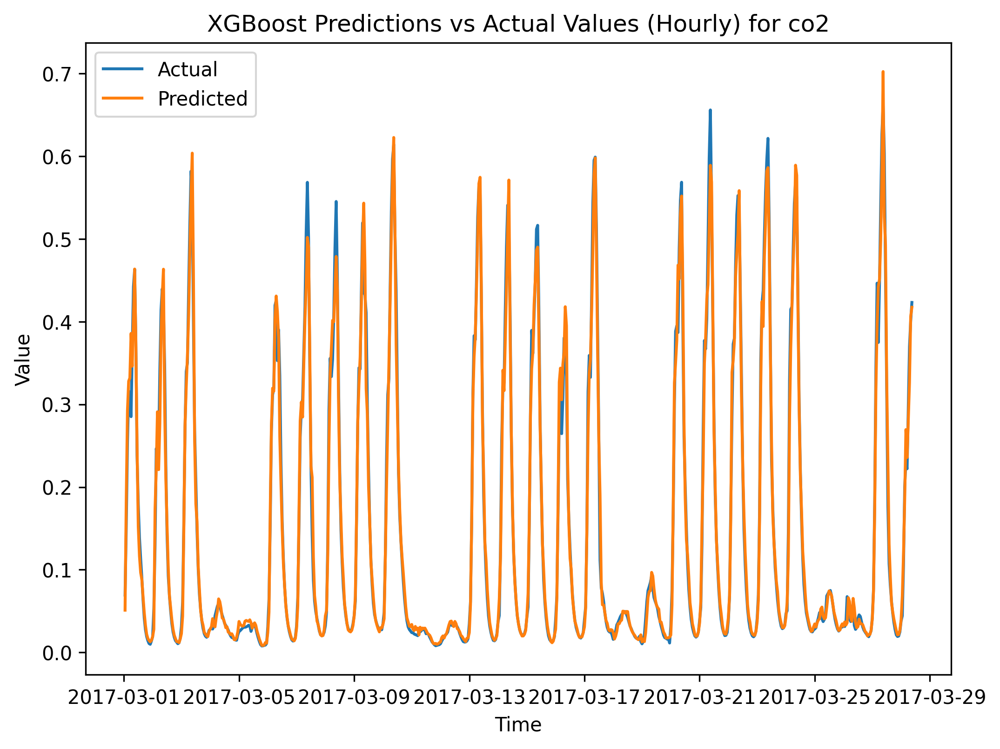

LightGBM Training MSE: 0.000000860
LightGBM Training MAPE: 0.013638784%
LightGBM Testing MSE: 0.000404734
LightGBM Testing MAPE: 0.104980095%
Performing grid search for Random Forest...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best hyperparameters found: {'max_depth': 40, 'n_estimators': 450}


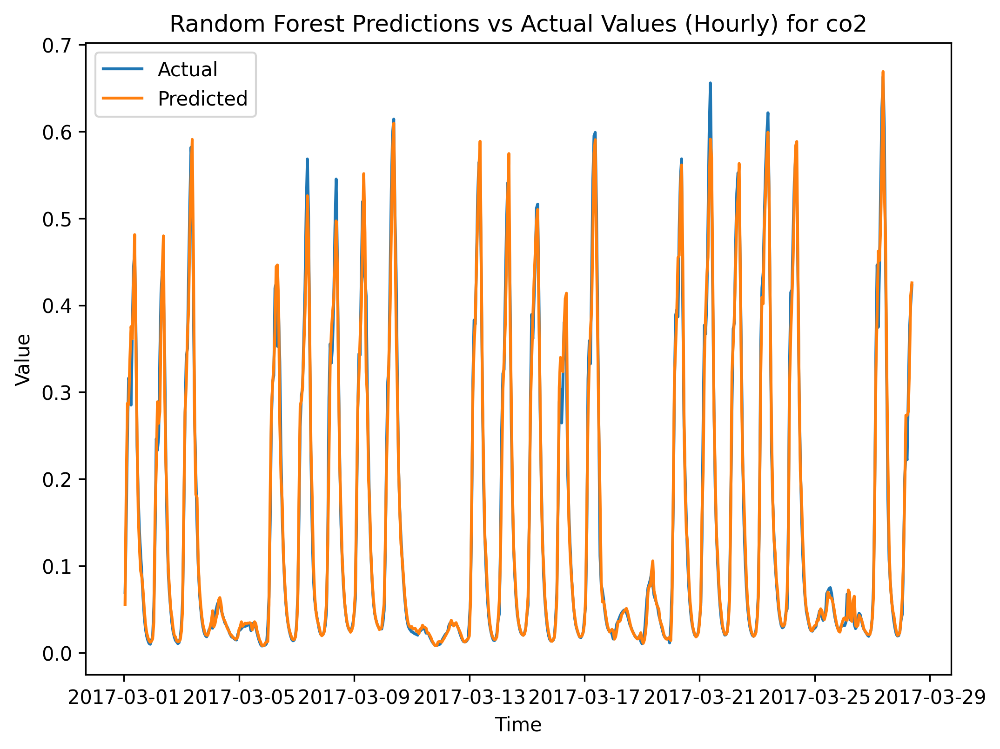

Random Forest Training MSE: 0.000084418
Random Forest Training MAPE: 0.035439795%
Random Forest Testing MSE: 0.000413089
Random Forest Testing MAPE: 0.097696661%
Performing grid search for KNN...
Fitting 5 folds for each of 42 candidates, totalling 210 fits
Best hyperparameters found: {'n_neighbors': 5, 'p': 1, 'weights': 'distance'}


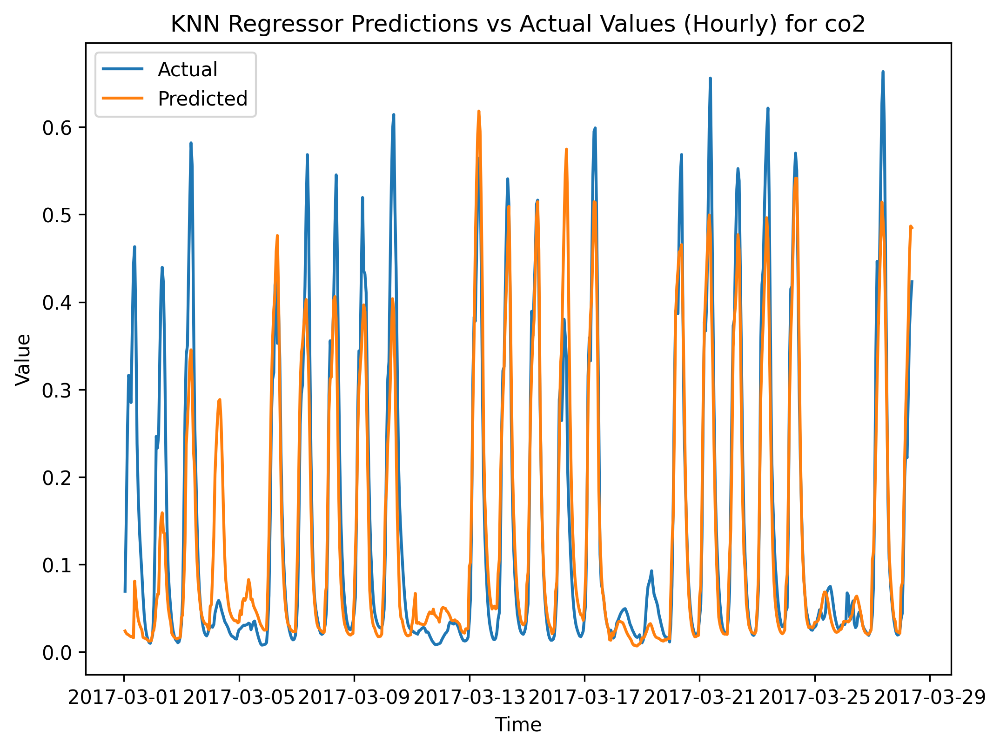

KNN Regressor Training MSE: 0.000000000
KNN Regressor Training MAPE: 0.000000000%
KNN Regressor Testing MSE: 0.005503547
KNN Regressor Testing MAPE: 0.516114707%
Performing grid search for SVR...
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best hyperparameters found: {'C': 1, 'epsilon': 0.01, 'kernel': 'linear'}


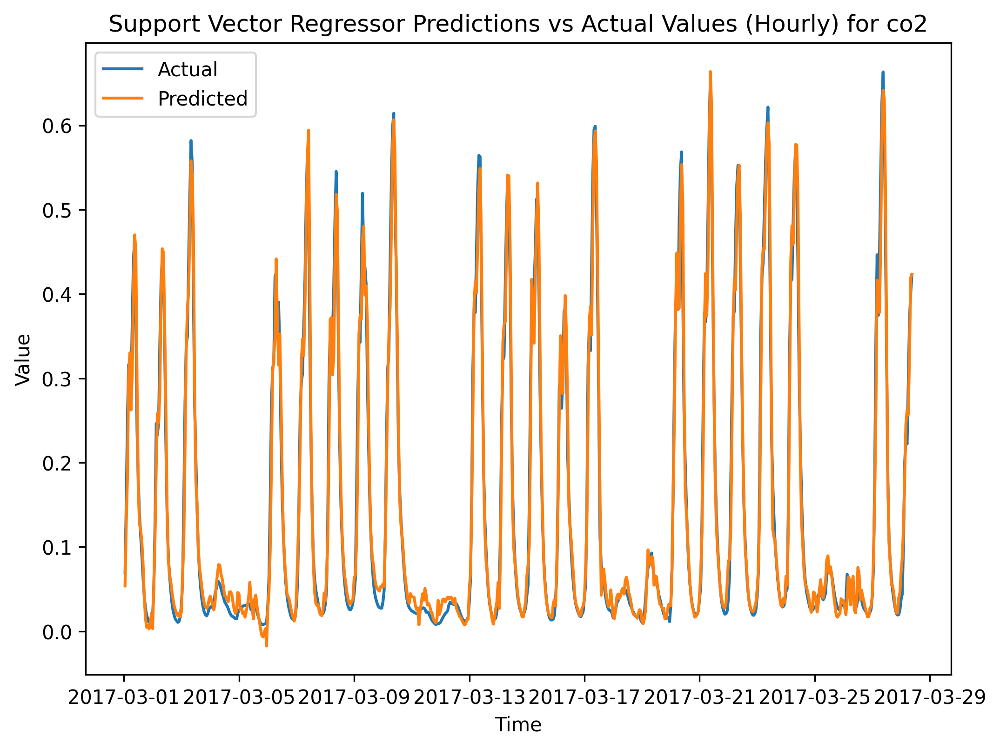

Support Vector Regressor Training MSE: 0.000718066
Support Vector Regressor Training MAPE: 0.230627717%
Support Vector Regressor Testing MSE: 0.000684349
Support Vector Regressor Testing MAPE: 0.242445653%
Performing grid search for Decision Tree...
Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best hyperparameters found: {'max_depth': 5, 'min_samples_leaf': 8, 'min_samples_split': 10}


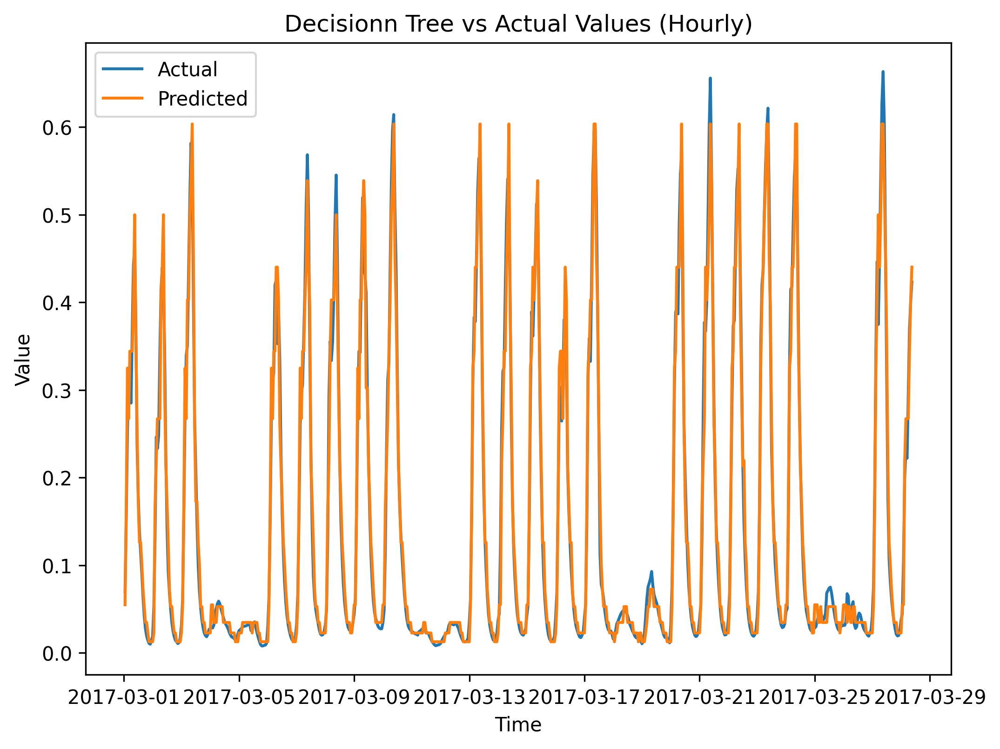

Decisionn Tree Training MSE: 0.000769354
Decisionn Tree Training MAPE: 0.177978255%
Decisionn Tree Testing MSE: 0.000695668
Decisionn Tree Testing MAPE: 0.181930611%
Performing grid search for Lasso Regression...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hyperparameters found: {'alpha': 0.001, 'fit_intercept': False}


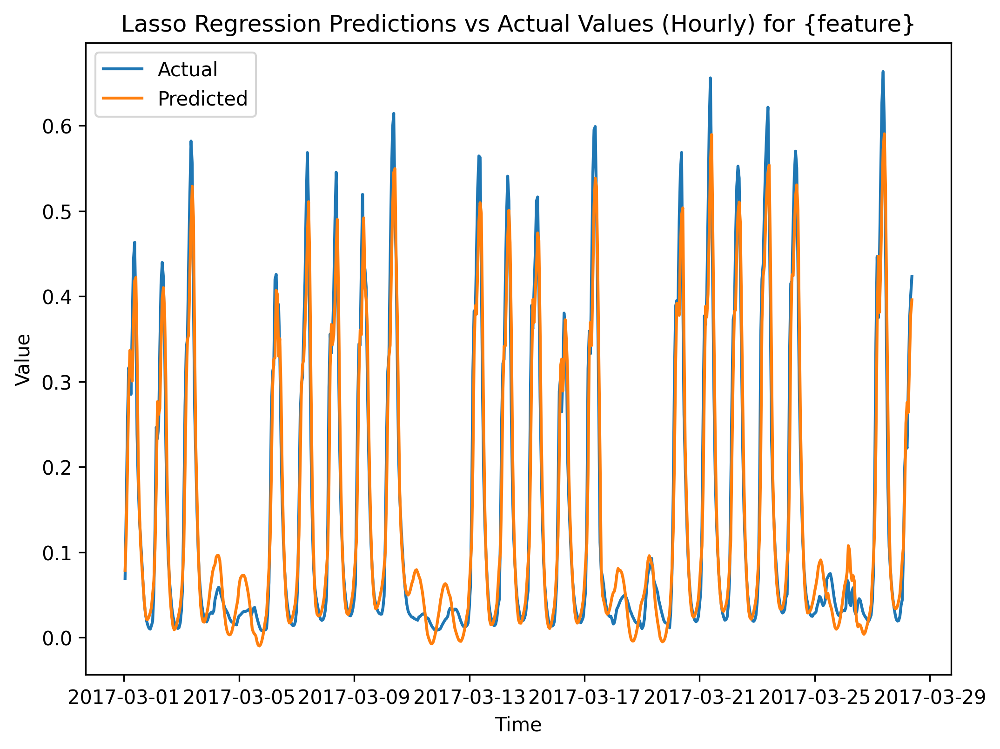

Lasso Regression Training MSE: 0.001914874
Lasso Regression Training MAPE: 0.545631191%
Lasso Regression Testing MSE: 0.001712633
Lasso Regression Testing MAPE: 0.470122443%
Epoch 1/100
3/3 [==============================] - 2s 138ms/step - loss: 0.1652
Epoch 2/100
3/3 [==============================] - 0s 129ms/step - loss: 0.1086
Epoch 3/100
3/3 [==============================] - 0s 133ms/step - loss: 0.0329
Epoch 4/100
3/3 [==============================] - 0s 141ms/step - loss: 0.0605
Epoch 5/100
3/3 [==============================] - 0s 145ms/step - loss: 0.0249
Epoch 6/100
3/3 [==============================] - 0s 135ms/step - loss: 0.0295
Epoch 7/100
3/3 [==============================] - 0s 137ms/step - loss: 0.0193
Epoch 8/100
3/3 [==============================] - 0s 142ms/step - loss: 0.0179
Epoch 9/100
3/3 [==============================] - 0s 142ms/step - loss: 0.0148
Epoch 10/100
3/3 [==============================] - 0s 139ms/step - loss: 0.0118
Epoch 11/100
3/3 [=======

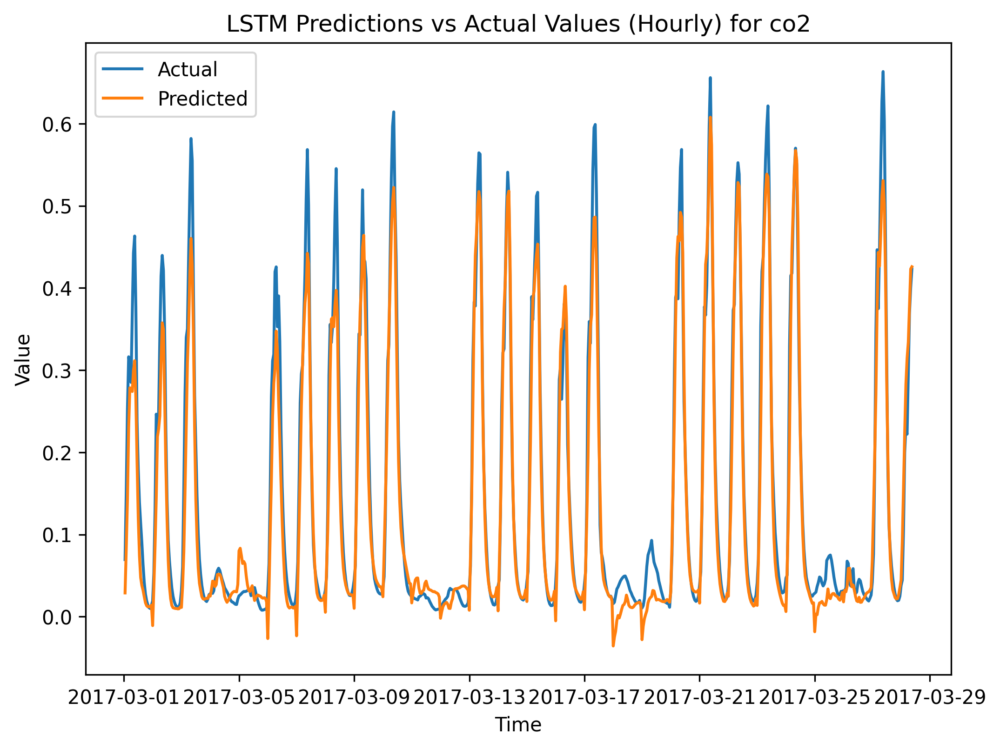

LSTM Training MSE: 0.000790149
LSTM Training MAPE: 0.238093197%
LSTM Testing MSE: 0.001531426
LSTM Testing MAPE: 0.355509283%
Performing grid search for LightGBM...
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best hyperparameters found: {'learning_rate': 0.1, 'n_estimators': 150, 'num_leaves': 90}


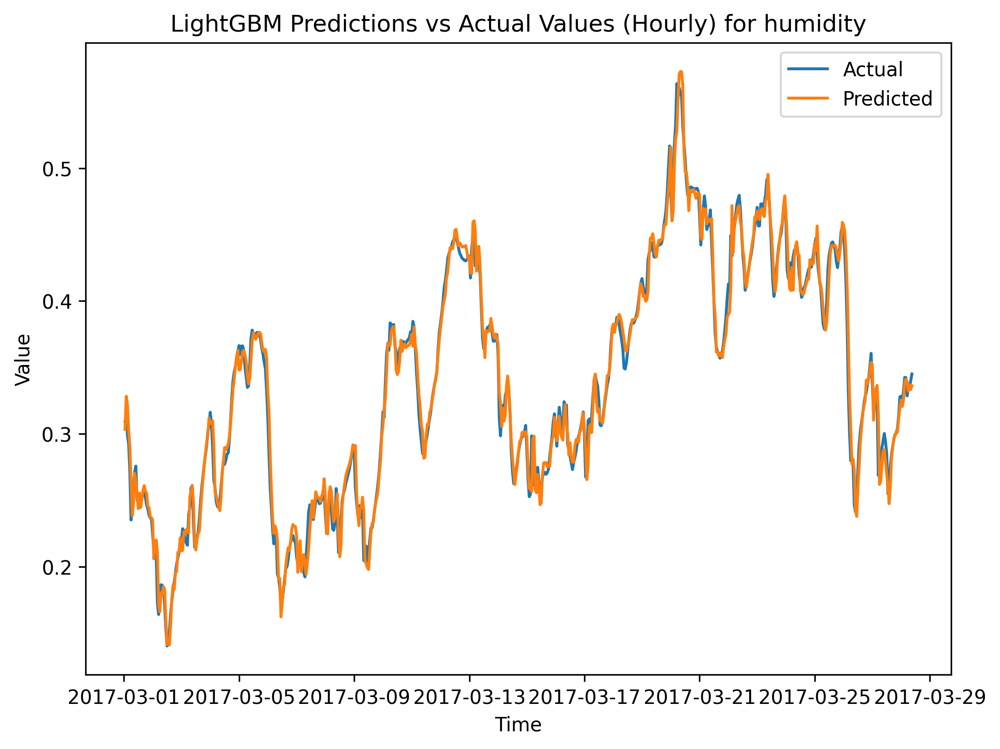

LightGBM Training MSE: 0.000004212
LightGBM Training MAPE: 0.003457760%
LightGBM Testing MSE: 0.000111255
LightGBM Testing MAPE: 0.024191800%
Performing grid search for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best hyperparameters found: {'learning_rate': 0.05, 'max_depth': 7, 'n_estimators': 450}


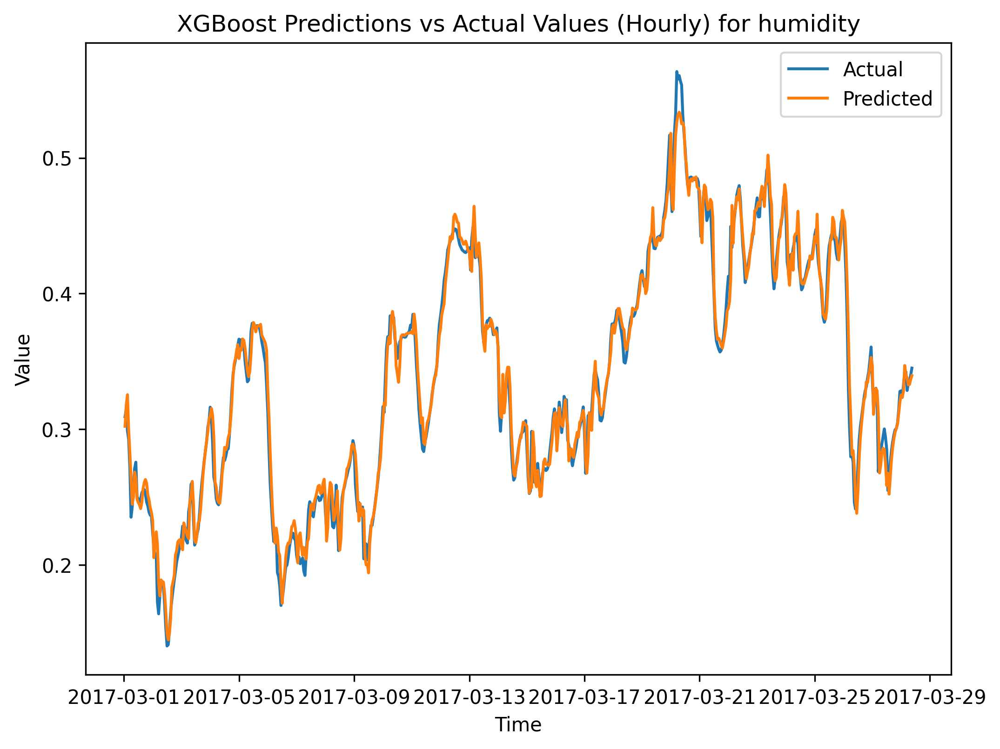

LightGBM Training MSE: 0.000001024
LightGBM Training MAPE: 0.002829244%
LightGBM Testing MSE: 0.000117086
LightGBM Testing MAPE: 0.024944269%
Performing grid search for Random Forest...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best hyperparameters found: {'max_depth': 40, 'n_estimators': 450}


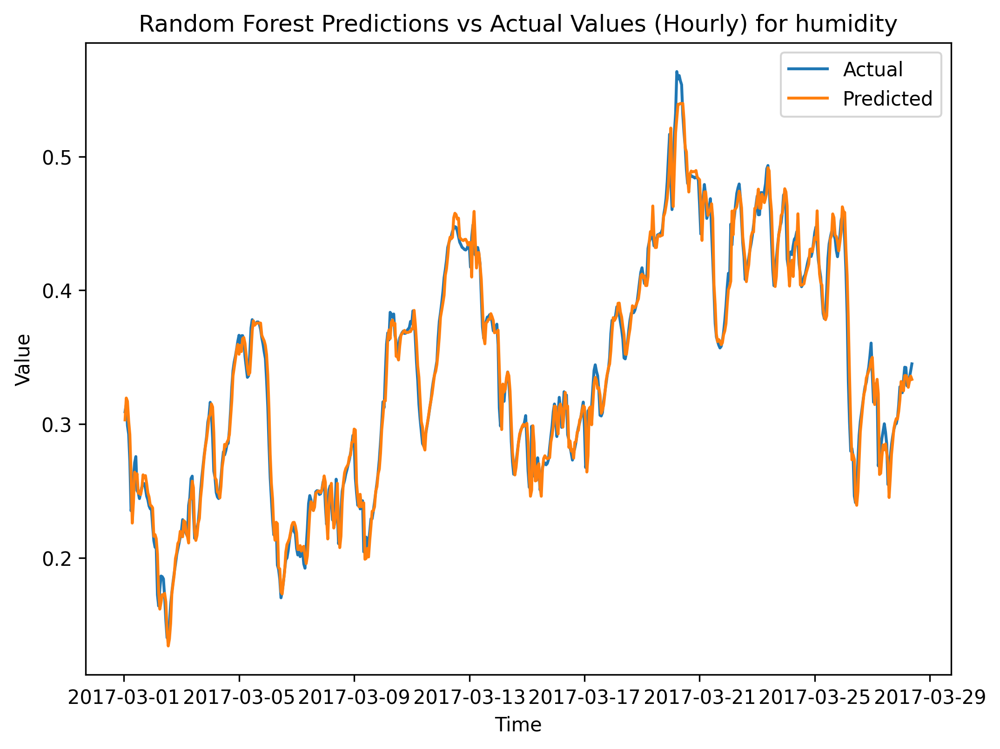

Random Forest Training MSE: 0.000018732
Random Forest Training MAPE: 0.012634437%
Random Forest Testing MSE: 0.000128039
Random Forest Testing MAPE: 0.025688158%
Performing grid search for KNN...
Fitting 5 folds for each of 42 candidates, totalling 210 fits
Best hyperparameters found: {'n_neighbors': 21, 'p': 1, 'weights': 'distance'}


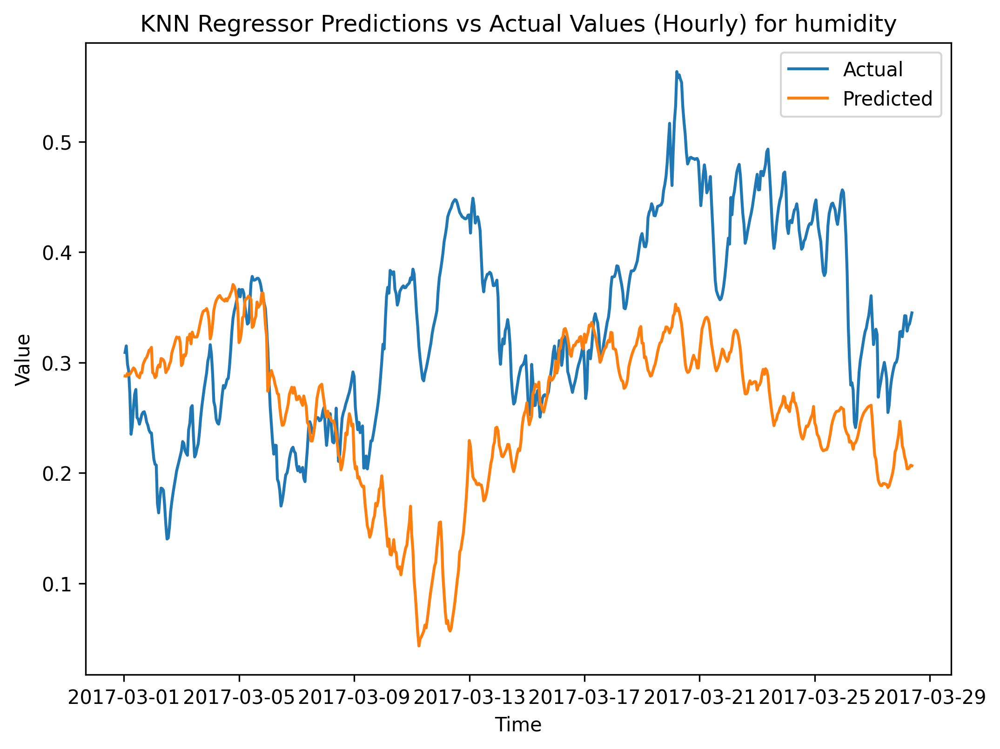

KNN Regressor Training MSE: 0.000000000
KNN Regressor Training MAPE: 0.000000000%
KNN Regressor Testing MSE: 0.018932042
KNN Regressor Testing MAPE: 0.315417635%
Performing grid search for SVR...
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best hyperparameters found: {'C': 10, 'epsilon': 0.01, 'kernel': 'linear'}


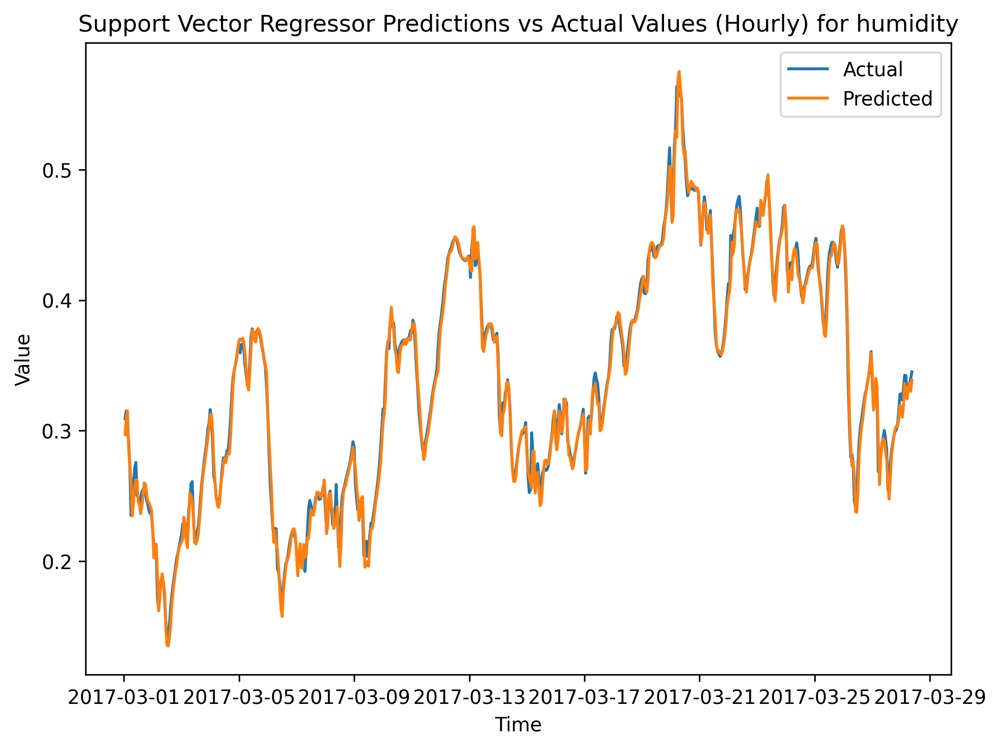

Support Vector Regressor Training MSE: 0.000053471
Support Vector Regressor Training MAPE: 0.020273428%
Support Vector Regressor Testing MSE: 0.000059303
Support Vector Regressor Testing MAPE: 0.018512824%
Performing grid search for Decision Tree...
Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best hyperparameters found: {'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 2}


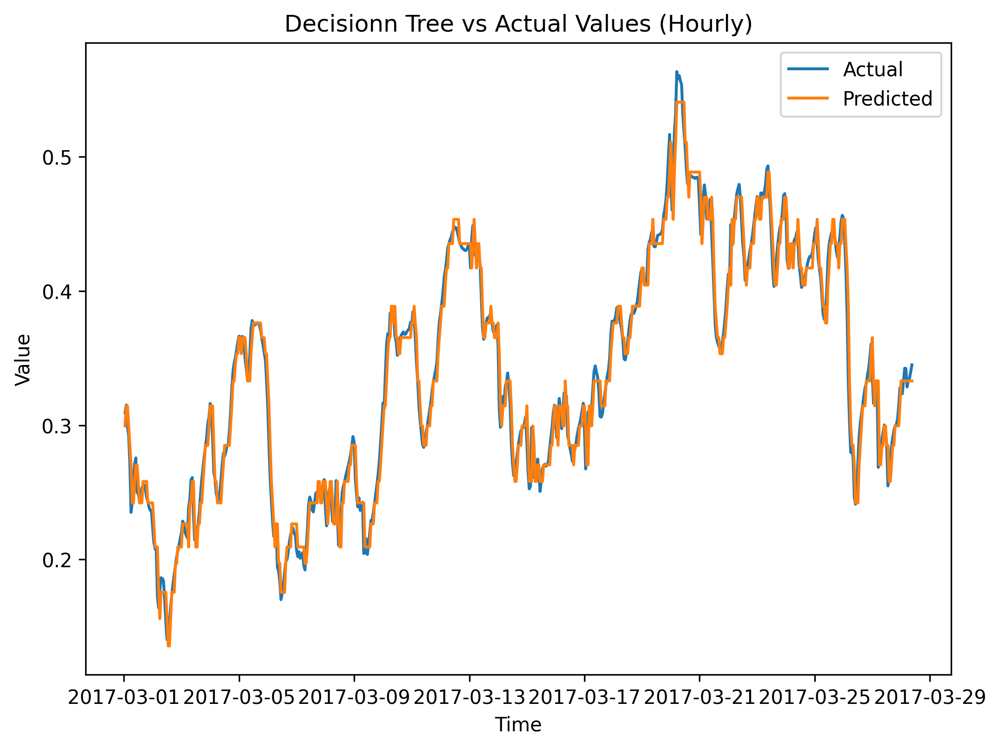

Decisionn Tree Training MSE: 0.000156977
Decisionn Tree Training MAPE: 0.042613706%
Decisionn Tree Testing MSE: 0.000163538
Decisionn Tree Testing MAPE: 0.030799742%
Performing grid search for Lasso Regression...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hyperparameters found: {'alpha': 0.001, 'fit_intercept': False}


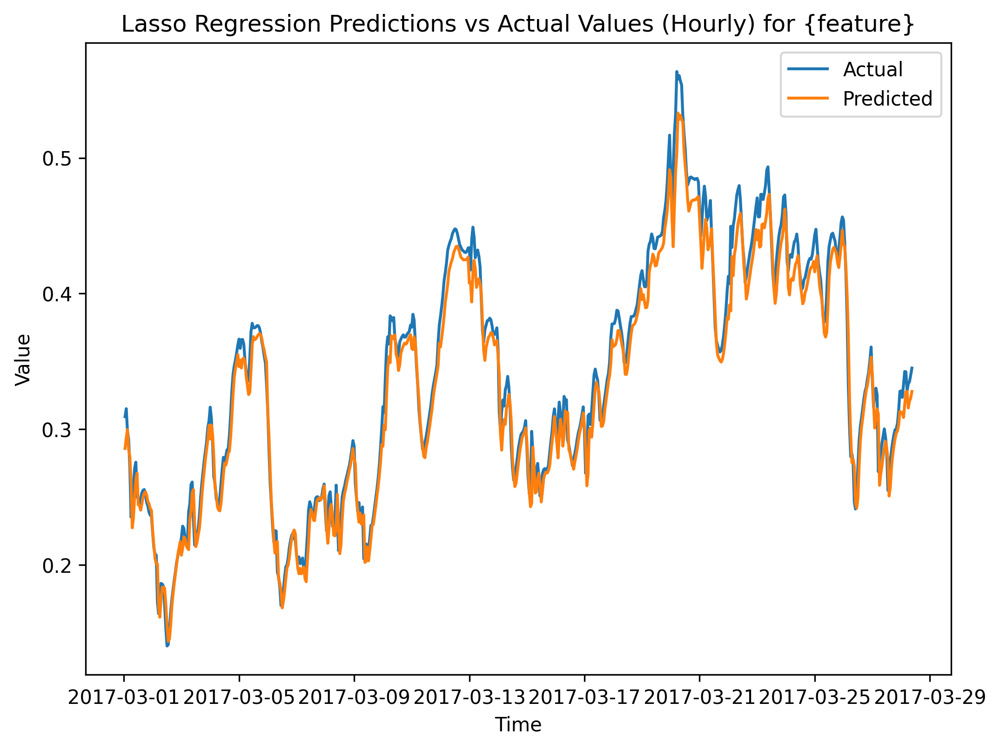

Lasso Regression Training MSE: 0.000192138
Lasso Regression Training MAPE: 0.045755821%
Lasso Regression Testing MSE: 0.000232814
Lasso Regression Testing MAPE: 0.035506393%
Epoch 1/100
3/3 [==============================] - 2s 162ms/step - loss: 0.0709
Epoch 2/100
3/3 [==============================] - 0s 133ms/step - loss: 0.0517
Epoch 3/100
3/3 [==============================] - 0s 136ms/step - loss: 0.0411
Epoch 4/100
3/3 [==============================] - 0s 138ms/step - loss: 0.0306
Epoch 5/100
3/3 [==============================] - 0s 138ms/step - loss: 0.0138
Epoch 6/100
3/3 [==============================] - 0s 139ms/step - loss: 0.0128
Epoch 7/100
3/3 [==============================] - 0s 133ms/step - loss: 0.0131
Epoch 8/100
3/3 [==============================] - 0s 144ms/step - loss: 0.0103
Epoch 9/100
3/3 [==============================] - 0s 141ms/step - loss: 0.0068
Epoch 10/100
3/3 [==============================] - 0s 139ms/step - loss: 0.0075
Epoch 11/100
3/3 [=======

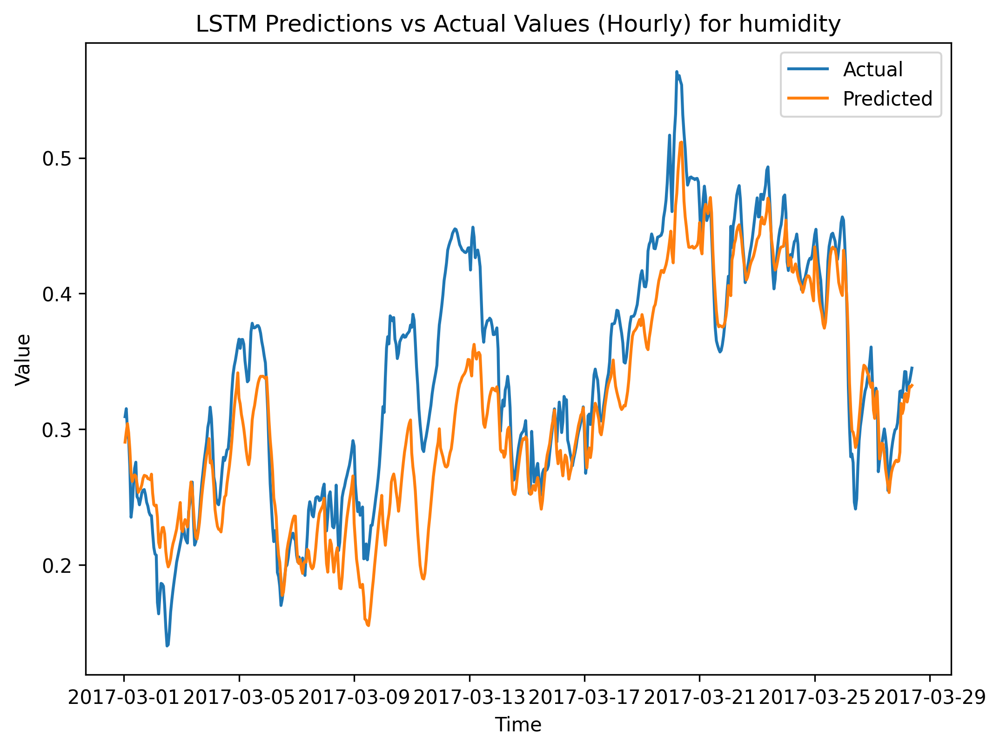

LSTM Training MSE: 0.000239744
LSTM Training MAPE: 0.047358666%
LSTM Testing MSE: 0.002205199
LSTM Testing MAPE: 0.103793574%
Performing grid search for LightGBM...
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best hyperparameters found: {'learning_rate': 0.01, 'n_estimators': 600, 'num_leaves': 90}


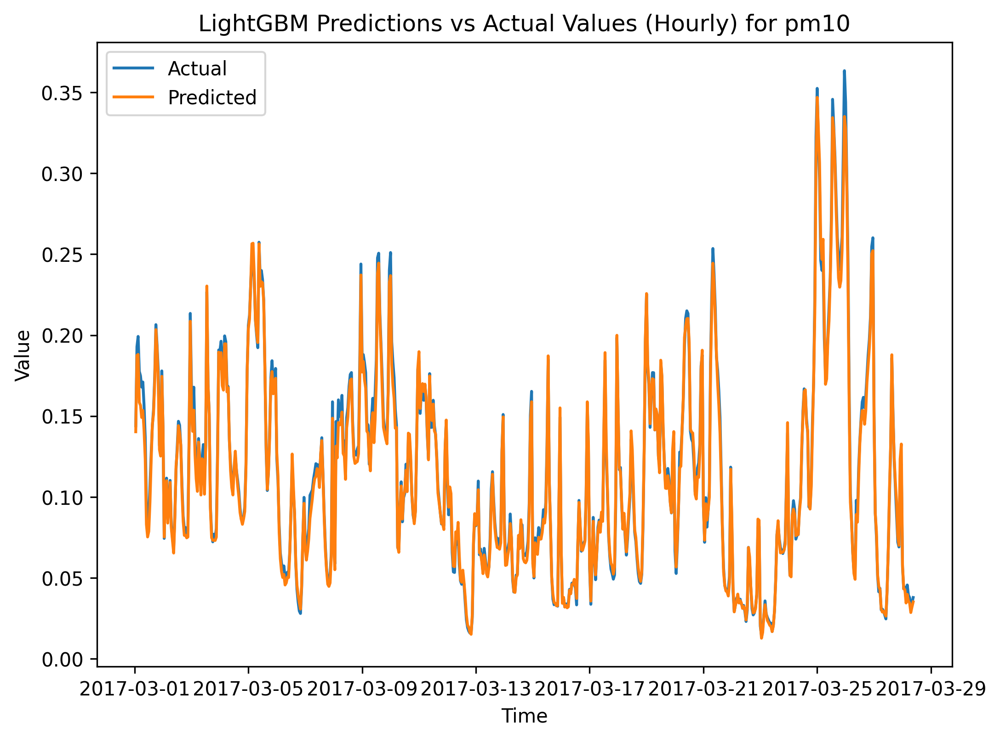

LightGBM Training MSE: 0.000016962
LightGBM Training MAPE: 0.013867735%
LightGBM Testing MSE: 0.000028441
LightGBM Testing MAPE: 0.037176319%
Performing grid search for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best hyperparameters found: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 450}


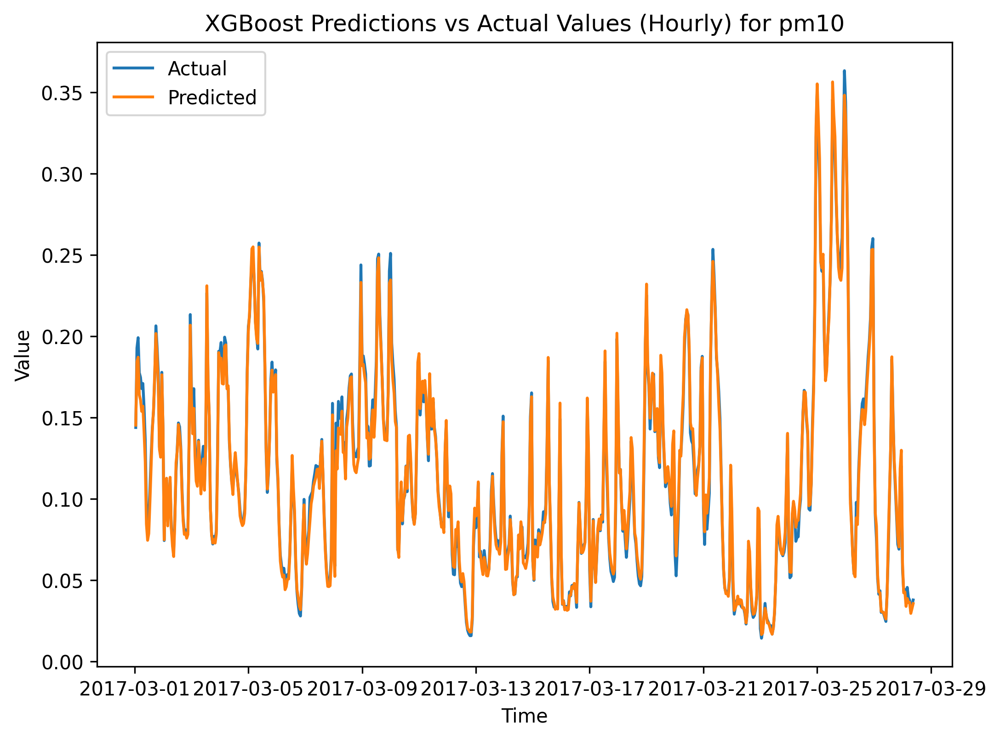

LightGBM Training MSE: 0.000000547
LightGBM Training MAPE: 0.007561641%
LightGBM Testing MSE: 0.000026492
LightGBM Testing MAPE: 0.041401718%
Performing grid search for Random Forest...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best hyperparameters found: {'max_depth': 100, 'n_estimators': 300}


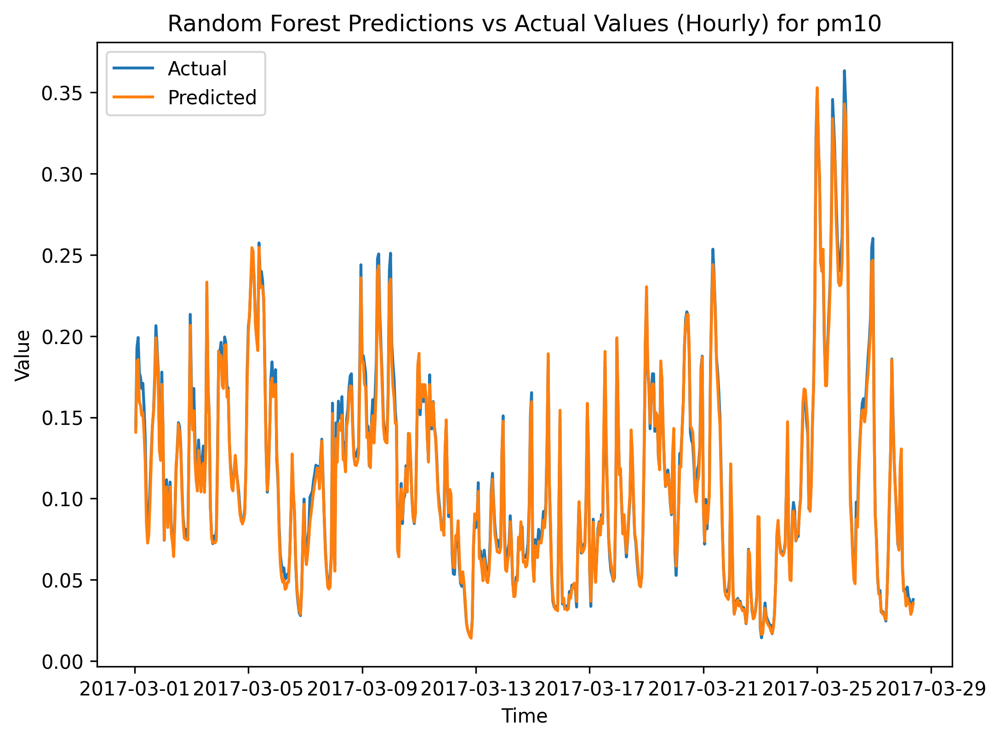

Random Forest Training MSE: 0.000008184
Random Forest Training MAPE: 0.013672420%
Random Forest Testing MSE: 0.000029416
Random Forest Testing MAPE: 0.039737419%
Performing grid search for KNN...
Fitting 5 folds for each of 42 candidates, totalling 210 fits
Best hyperparameters found: {'n_neighbors': 21, 'p': 1, 'weights': 'uniform'}


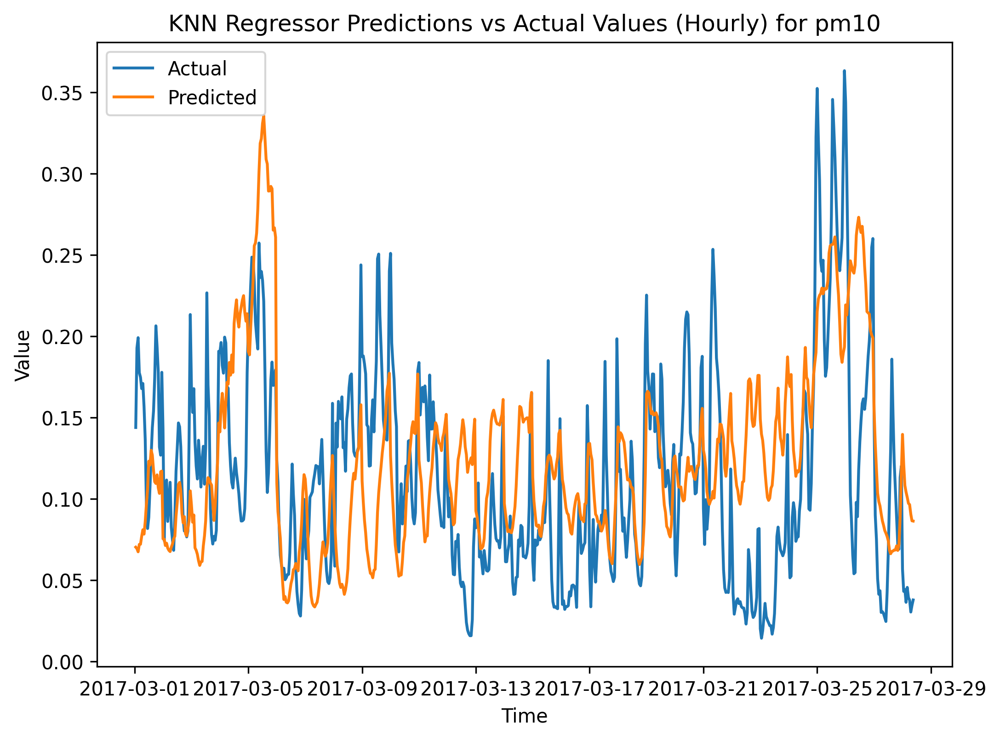

KNN Regressor Training MSE: 0.003076483
KNN Regressor Training MAPE: 0.506159877%
KNN Regressor Testing MSE: 0.004352128
KNN Regressor Testing MAPE: 0.737973559%
Performing grid search for SVR...
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best hyperparameters found: {'C': 10, 'epsilon': 0.01, 'kernel': 'linear'}


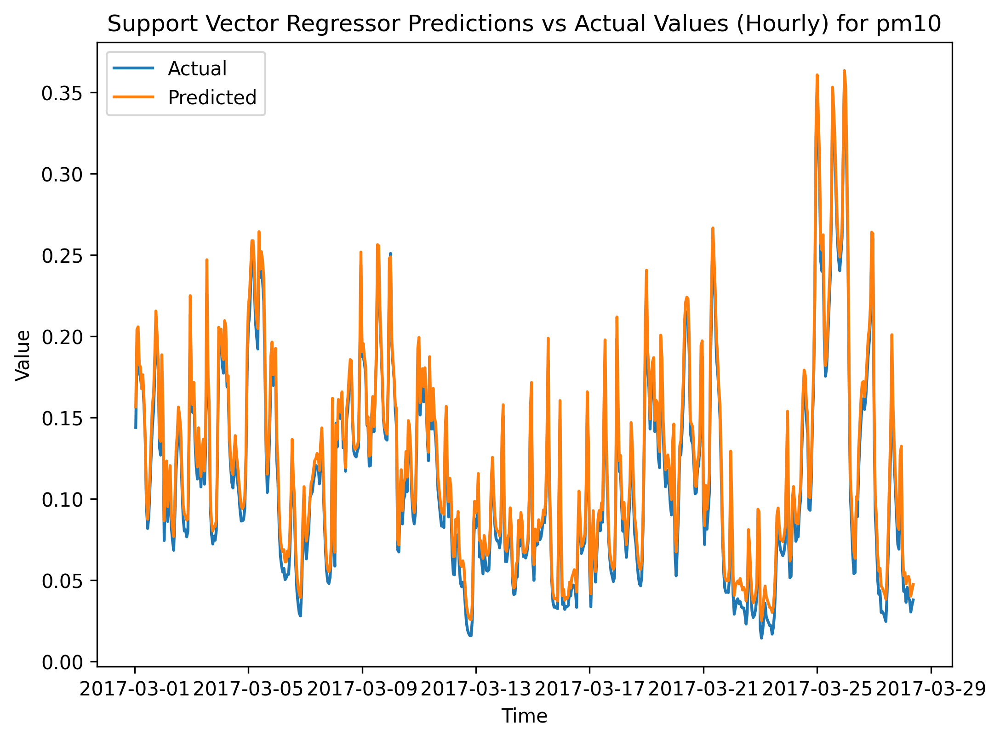

Support Vector Regressor Training MSE: 0.000031803
Support Vector Regressor Training MAPE: 0.044914421%
Support Vector Regressor Testing MSE: 0.000087944
Support Vector Regressor Testing MAPE: 0.117061339%
Performing grid search for Decision Tree...
Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best hyperparameters found: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}


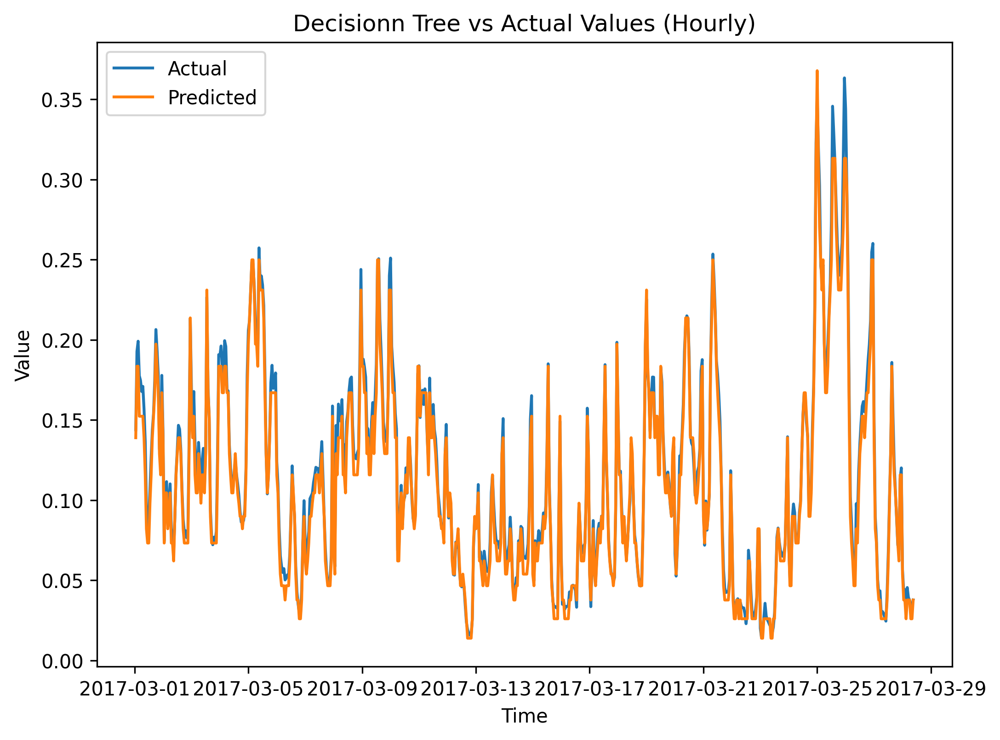

Decisionn Tree Training MSE: 0.000066012
Decisionn Tree Training MAPE: 0.067757572%
Decisionn Tree Testing MSE: 0.000065251
Decisionn Tree Testing MAPE: 0.063701307%
Performing grid search for Lasso Regression...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hyperparameters found: {'alpha': 0.001, 'fit_intercept': False}


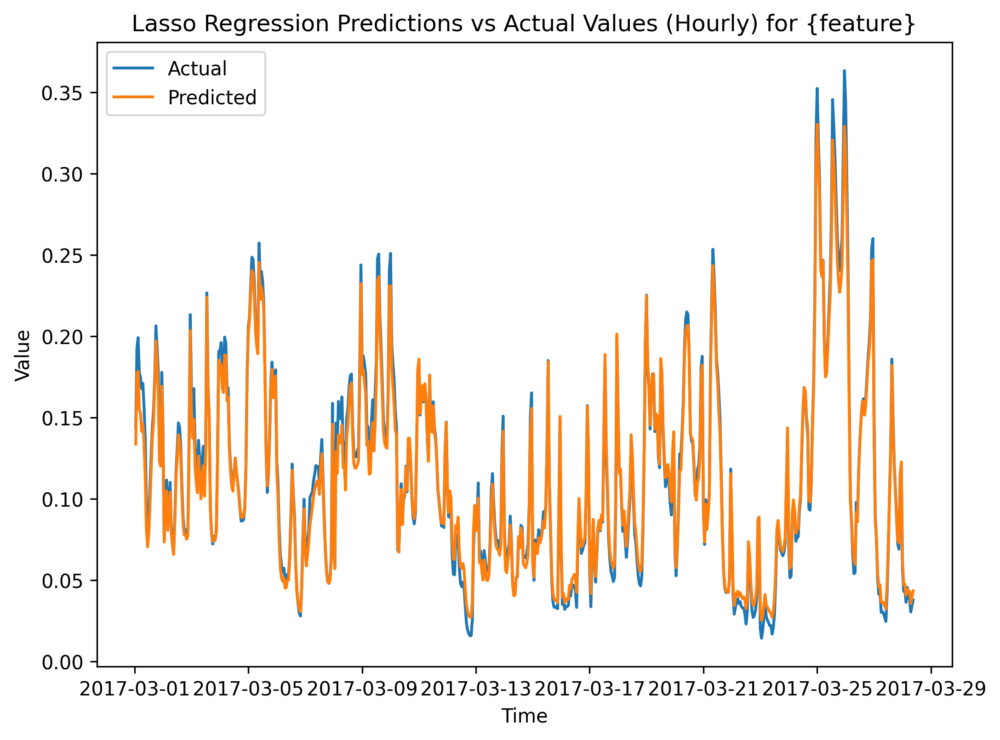

Lasso Regression Training MSE: 0.000111391
Lasso Regression Training MAPE: 0.081748476%
Lasso Regression Testing MSE: 0.000059781
Lasso Regression Testing MAPE: 0.072951299%
Epoch 1/100
3/3 [==============================] - 2s 157ms/step - loss: 0.1419
Epoch 2/100
3/3 [==============================] - 0s 141ms/step - loss: 0.0528
Epoch 3/100
3/3 [==============================] - 0s 136ms/step - loss: 0.0281
Epoch 4/100
3/3 [==============================] - 0s 133ms/step - loss: 0.0396
Epoch 5/100
3/3 [==============================] - 0s 140ms/step - loss: 0.0197
Epoch 6/100
3/3 [==============================] - 0s 143ms/step - loss: 0.0173
Epoch 7/100
3/3 [==============================] - 0s 142ms/step - loss: 0.0148
Epoch 8/100
3/3 [==============================] - 0s 134ms/step - loss: 0.0095
Epoch 9/100
3/3 [==============================] - 0s 139ms/step - loss: 0.0108
Epoch 10/100
3/3 [==============================] - 0s 139ms/step - loss: 0.0050
Epoch 11/100
3/3 [=======

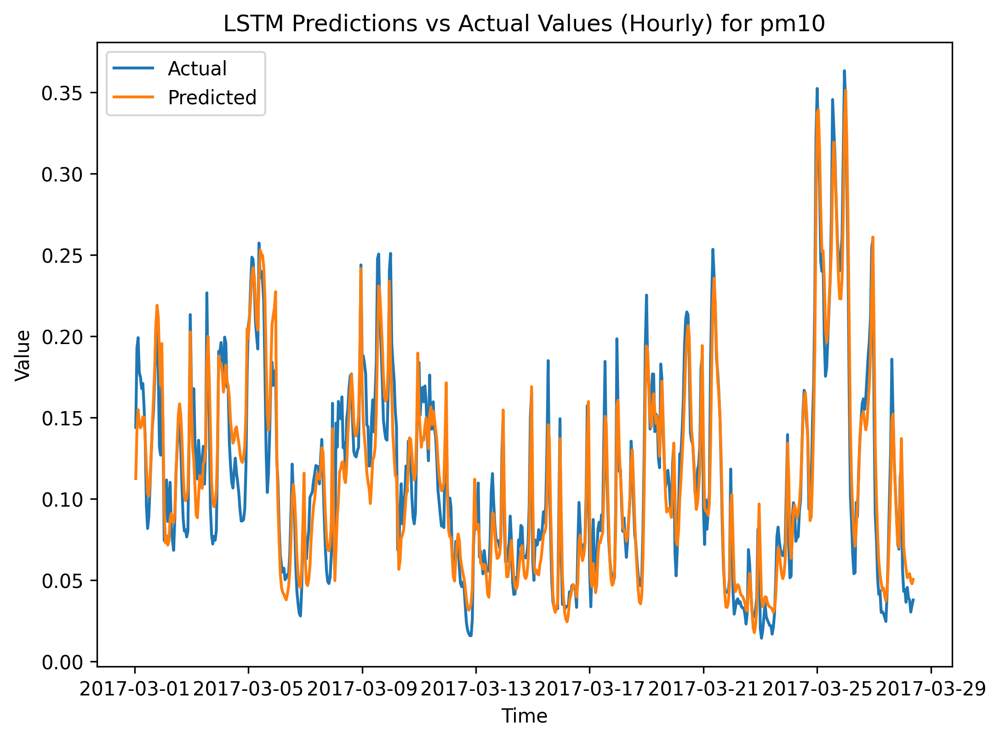

LSTM Training MSE: 0.000211432
LSTM Training MAPE: 0.109333295%
LSTM Testing MSE: 0.000416319
LSTM Testing MAPE: 0.184441704%
Performing grid search for LightGBM...
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best hyperparameters found: {'learning_rate': 0.05, 'n_estimators': 600, 'num_leaves': 90}


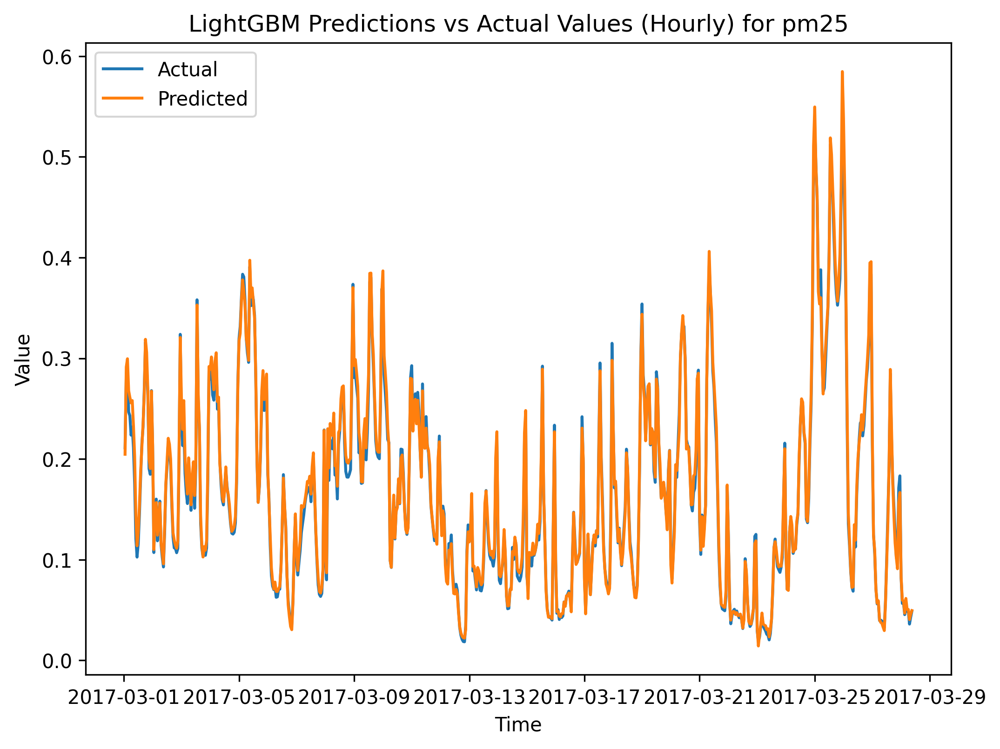

LightGBM Training MSE: 0.000002589
LightGBM Training MAPE: 0.001653612%
LightGBM Testing MSE: 0.000070047
LightGBM Testing MAPE: 0.041513952%
Performing grid search for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best hyperparameters found: {'learning_rate': 0.05, 'max_depth': 9, 'n_estimators': 150}


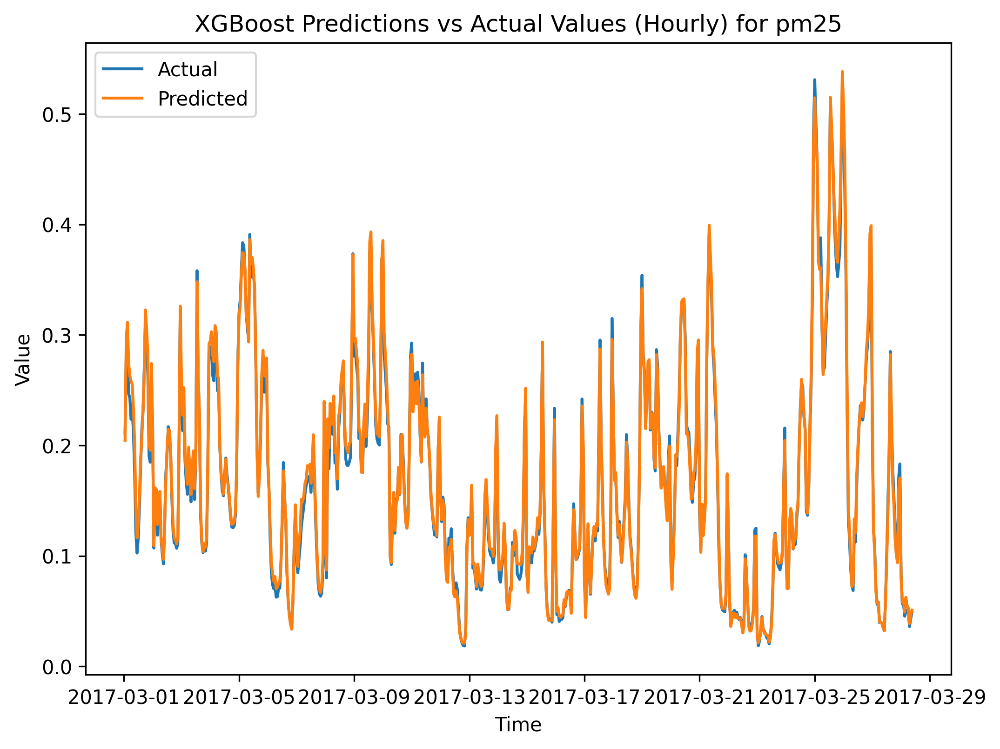

LightGBM Training MSE: 0.000001001
LightGBM Training MAPE: 0.008539246%
LightGBM Testing MSE: 0.000060587
LightGBM Testing MAPE: 0.039854262%
Performing grid search for Random Forest...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best hyperparameters found: {'max_depth': 40, 'n_estimators': 450}


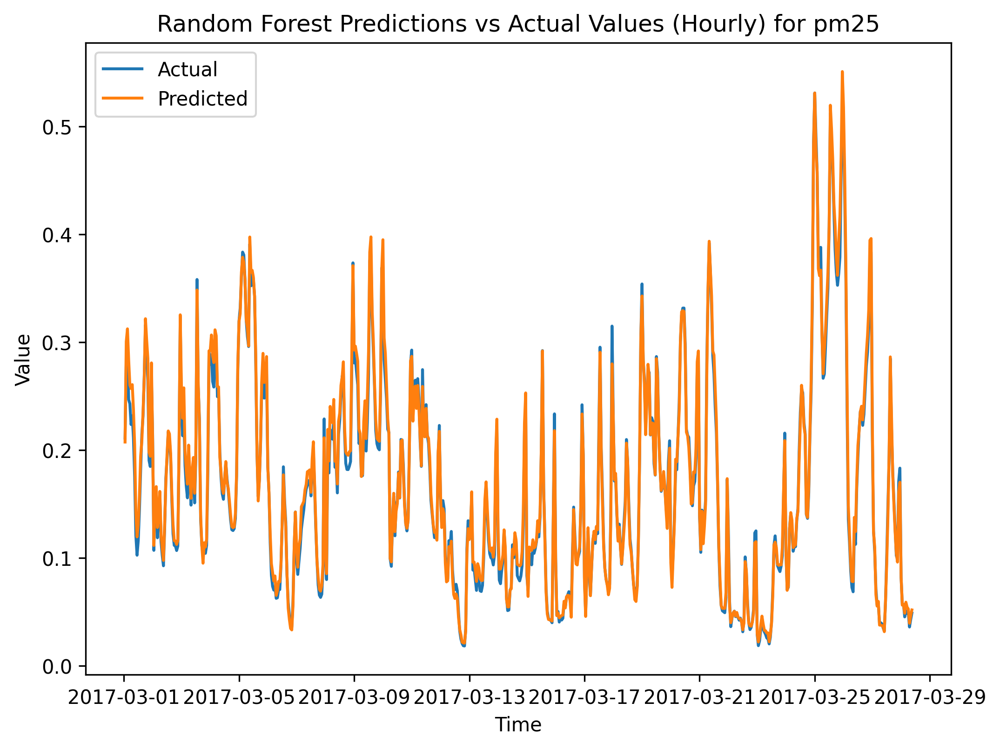

Random Forest Training MSE: 0.000014190
Random Forest Training MAPE: 0.013872576%
Random Forest Testing MSE: 0.000075543
Random Forest Testing MAPE: 0.044908229%
Performing grid search for KNN...
Fitting 5 folds for each of 42 candidates, totalling 210 fits
Best hyperparameters found: {'n_neighbors': 21, 'p': 1, 'weights': 'uniform'}


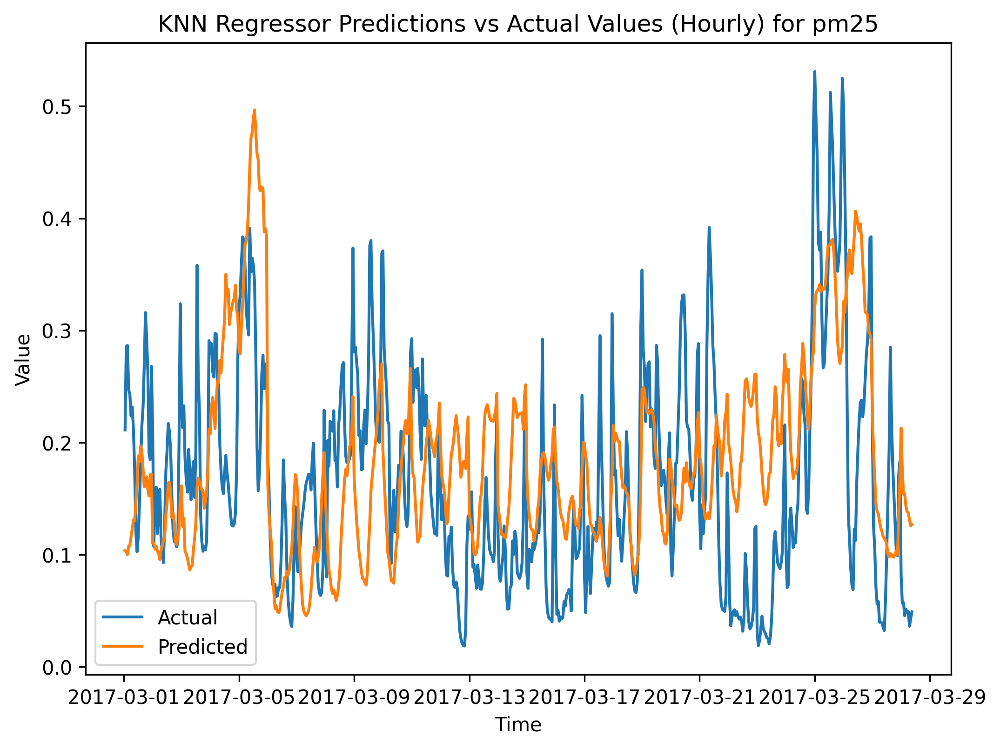

KNN Regressor Training MSE: 0.008045343
KNN Regressor Training MAPE: 0.564094952%
KNN Regressor Testing MSE: 0.010209235
KNN Regressor Testing MAPE: 0.838719784%
Performing grid search for SVR...
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best hyperparameters found: {'C': 10, 'epsilon': 0.01, 'kernel': 'linear'}


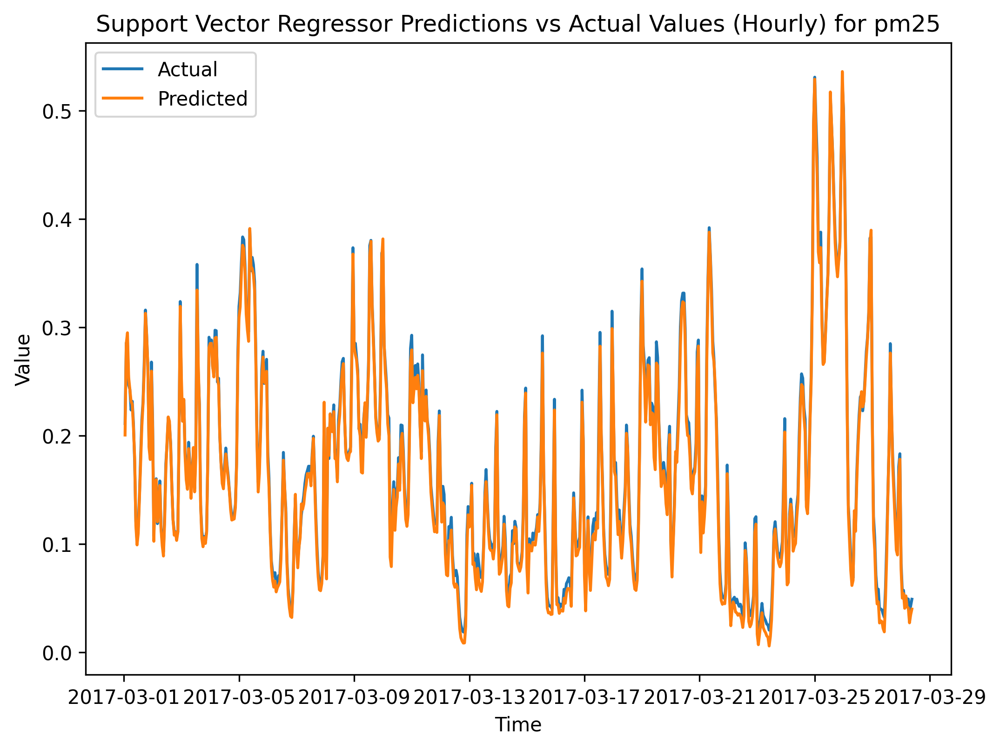

Support Vector Regressor Training MSE: 0.000065681
Support Vector Regressor Training MAPE: 0.031378735%
Support Vector Regressor Testing MSE: 0.000062987
Support Vector Regressor Testing MAPE: 0.070537072%
Performing grid search for Decision Tree...
Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best hyperparameters found: {'max_depth': 7, 'min_samples_leaf': 8, 'min_samples_split': 5}


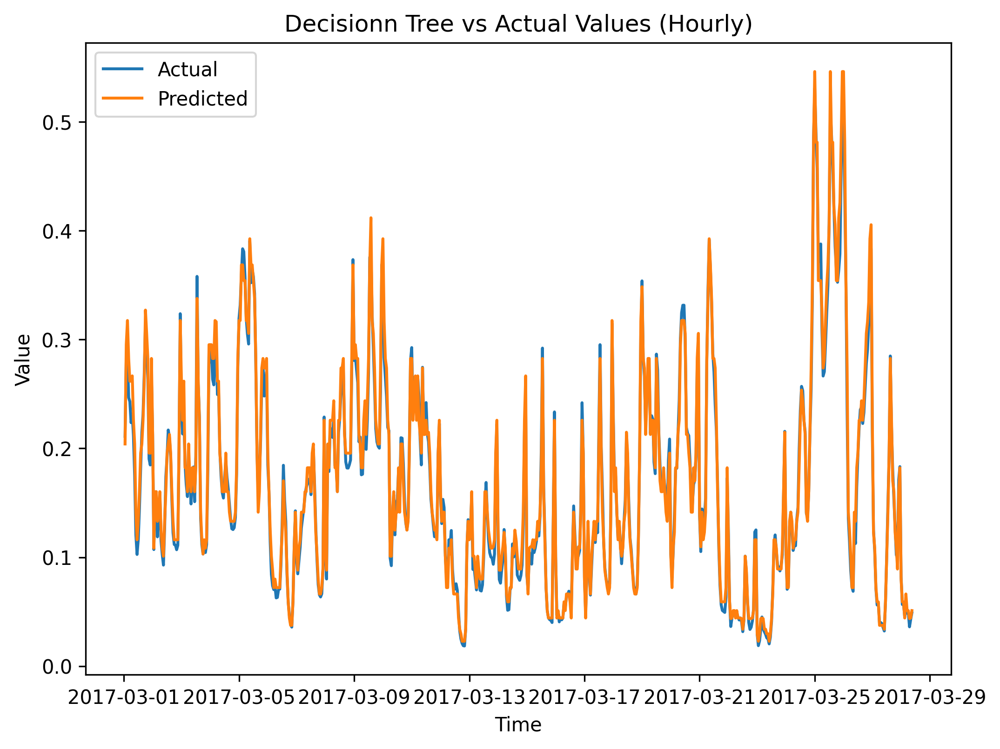

Decisionn Tree Training MSE: 0.000093407
Decisionn Tree Training MAPE: 0.043239088%
Decisionn Tree Testing MSE: 0.000116747
Decisionn Tree Testing MAPE: 0.053614164%
Performing grid search for Lasso Regression...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hyperparameters found: {'alpha': 0.001, 'fit_intercept': False}


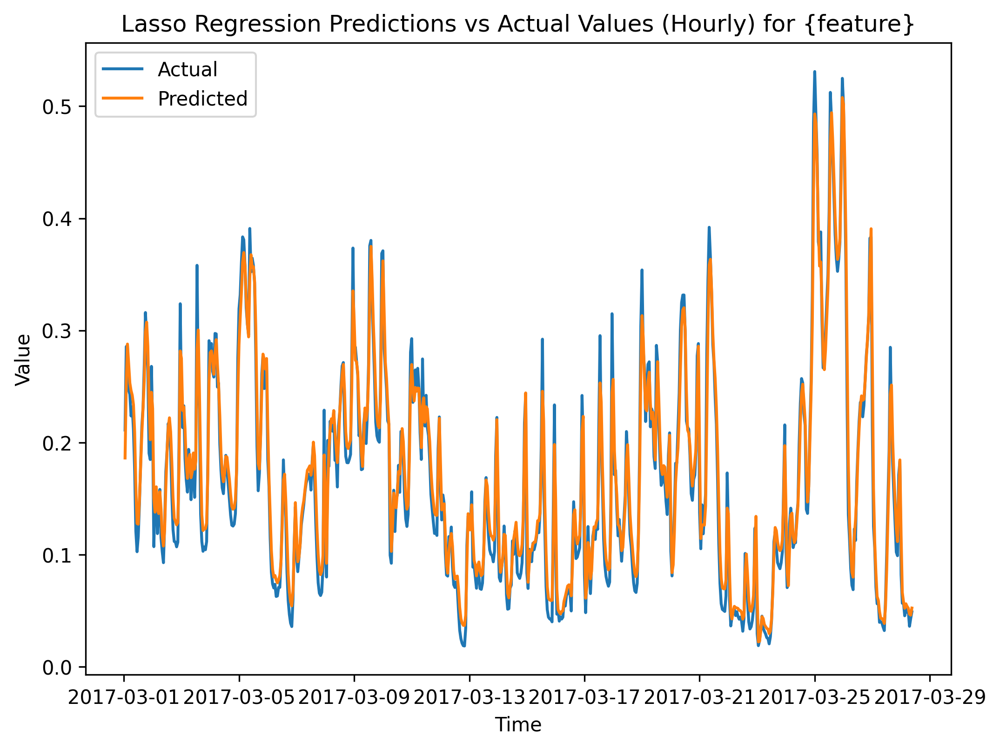

Lasso Regression Training MSE: 0.000423015
Lasso Regression Training MAPE: 0.130789931%
Lasso Regression Testing MSE: 0.000363445
Lasso Regression Testing MAPE: 0.123961660%
Epoch 1/100
3/3 [==============================] - 2s 138ms/step - loss: 0.2391
Epoch 2/100
3/3 [==============================] - 1s 157ms/step - loss: 0.1316
Epoch 3/100
3/3 [==============================] - 0s 139ms/step - loss: 0.1156
Epoch 4/100
3/3 [==============================] - 0s 144ms/step - loss: 0.0384
Epoch 5/100
3/3 [==============================] - 0s 139ms/step - loss: 0.0728
Epoch 6/100
3/3 [==============================] - 0s 138ms/step - loss: 0.0300
Epoch 7/100
3/3 [==============================] - 0s 146ms/step - loss: 0.0397
Epoch 8/100
3/3 [==============================] - 0s 141ms/step - loss: 0.0266
Epoch 9/100
3/3 [==============================] - 0s 137ms/step - loss: 0.0223
Epoch 10/100
3/3 [==============================] - 0s 136ms/step - loss: 0.0227
Epoch 11/100
3/3 [=======

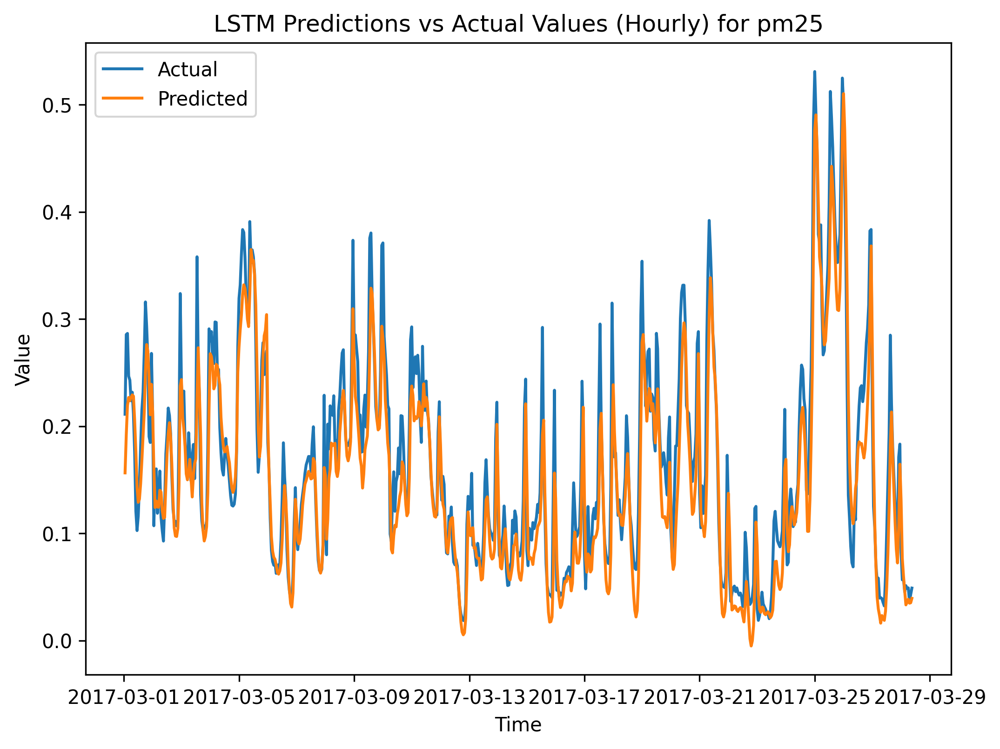

LSTM Training MSE: 0.000736161
LSTM Training MAPE: 0.151848608%
LSTM Testing MSE: 0.001370722
LSTM Testing MAPE: 0.200126179%
Performing grid search for LightGBM...
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best hyperparameters found: {'learning_rate': 0.05, 'n_estimators': 300, 'num_leaves': 90}


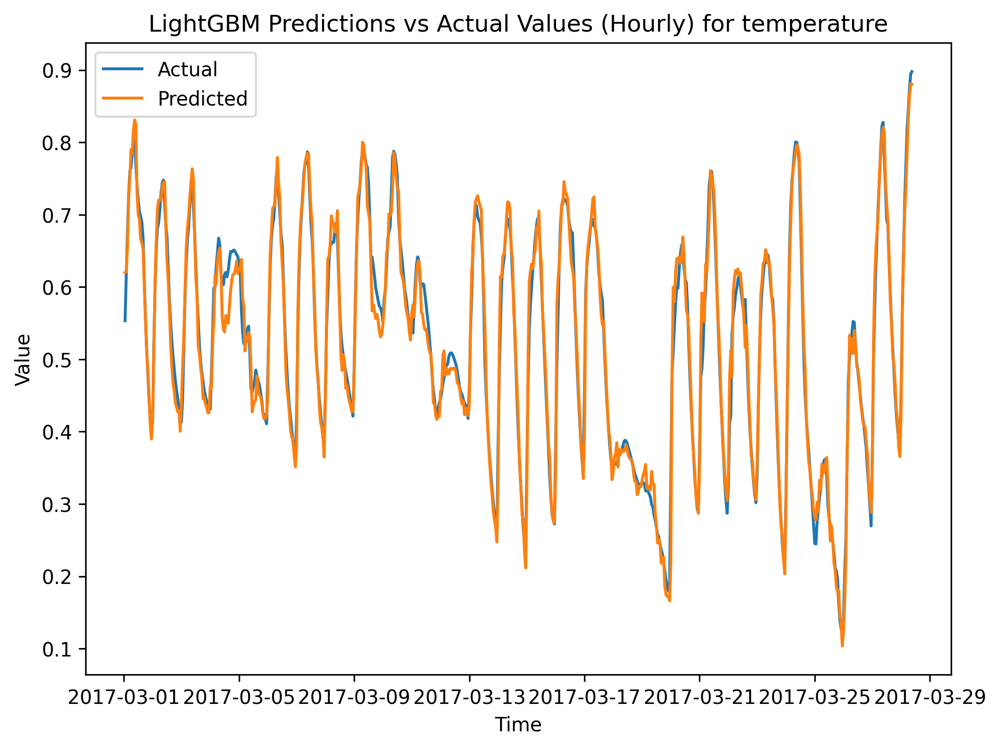

LightGBM Training MSE: 0.000013356
LightGBM Training MAPE: 0.004267321%
LightGBM Testing MSE: 0.000554538
LightGBM Testing MAPE: 0.035484670%
Performing grid search for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best hyperparameters found: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300}


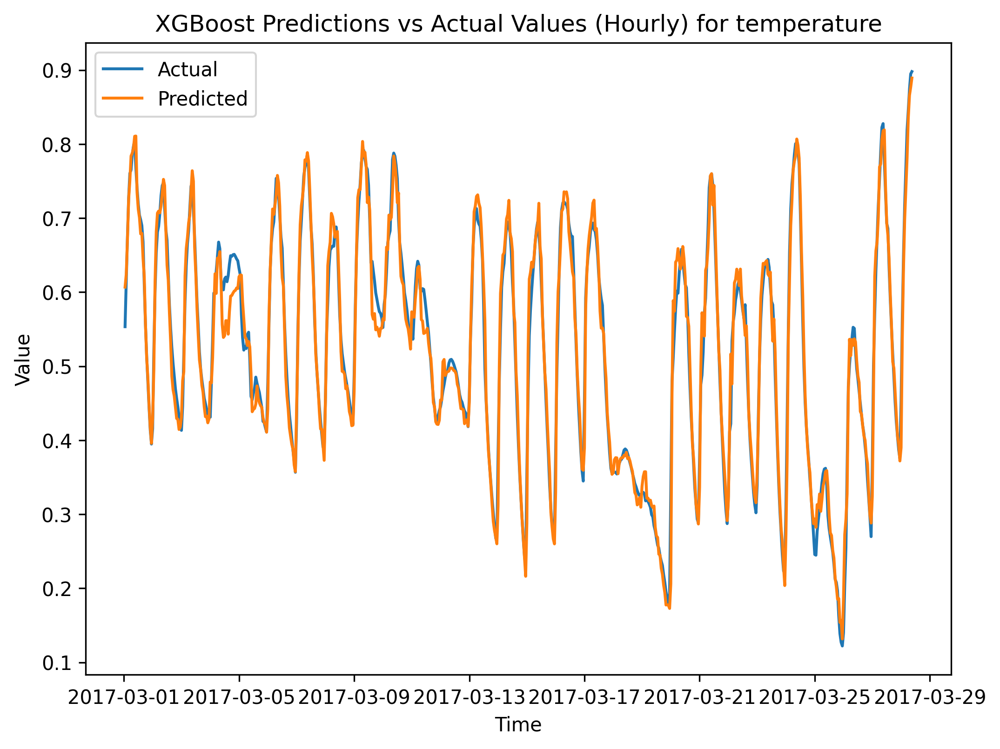

LightGBM Training MSE: 0.000001147
LightGBM Training MAPE: 0.001888321%
LightGBM Testing MSE: 0.000578584
LightGBM Testing MAPE: 0.036092700%
Performing grid search for Random Forest...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best hyperparameters found: {'max_depth': 100, 'n_estimators': 450}


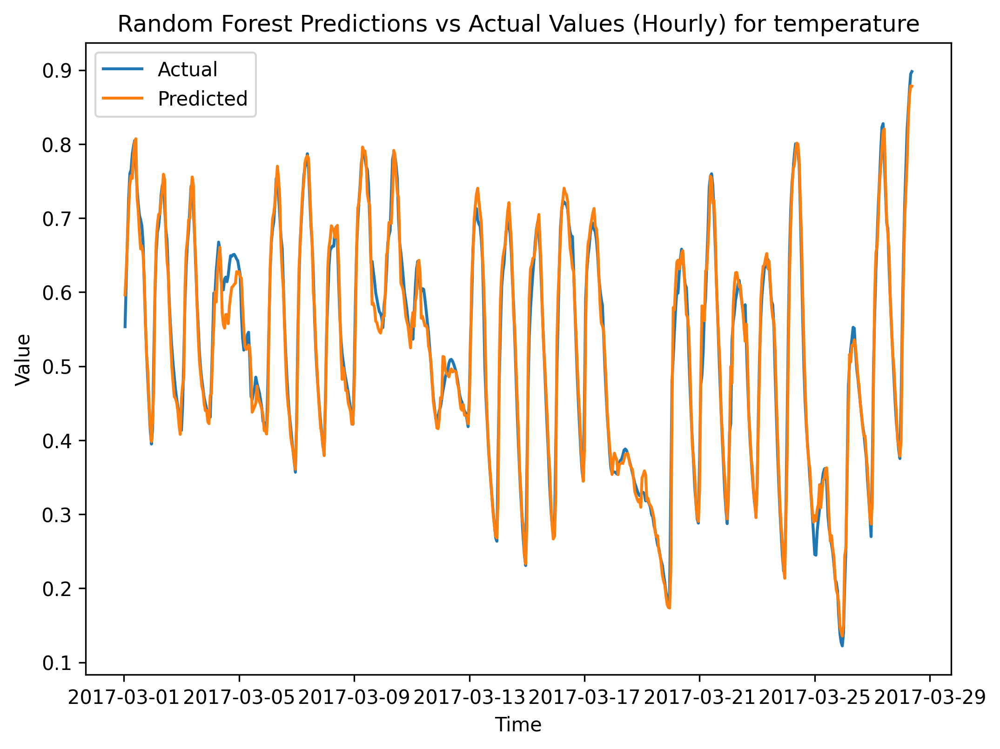

Random Forest Training MSE: 0.000112637
Random Forest Training MAPE: 0.015124795%
Random Forest Testing MSE: 0.000481592
Random Forest Testing MAPE: 0.032744304%
Performing grid search for KNN...
Fitting 5 folds for each of 42 candidates, totalling 210 fits
Best hyperparameters found: {'n_neighbors': 11, 'p': 1, 'weights': 'distance'}


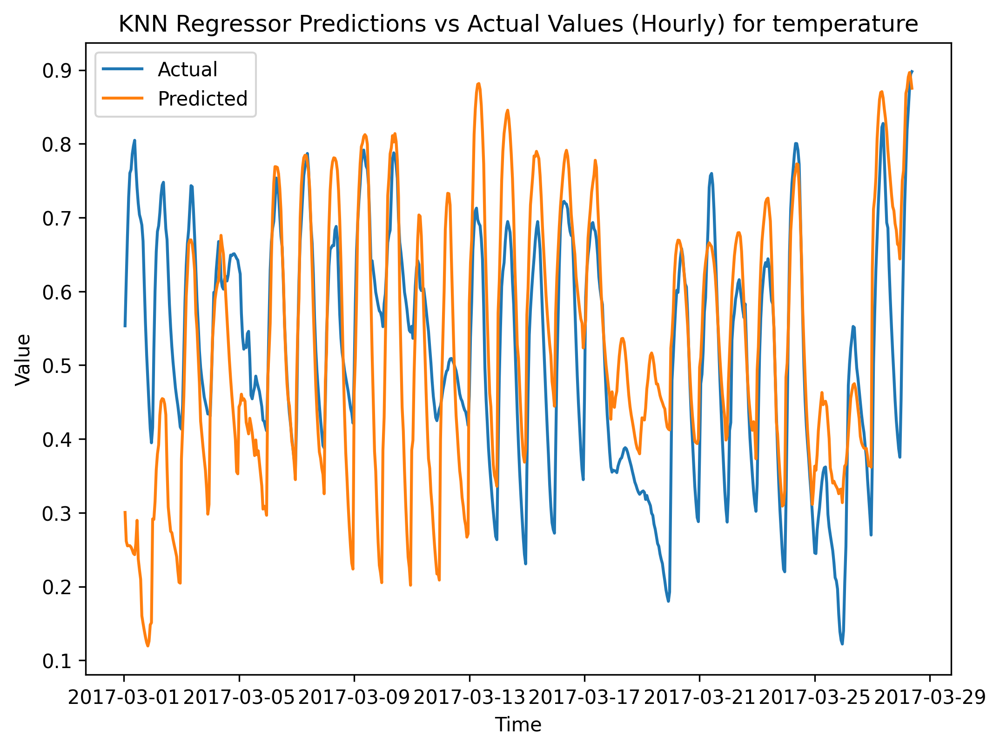

KNN Regressor Training MSE: 0.000000000
KNN Regressor Training MAPE: 0.000000000%
KNN Regressor Testing MSE: 0.022574534
KNN Regressor Testing MAPE: 0.249718650%
Performing grid search for SVR...
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best hyperparameters found: {'C': 10, 'epsilon': 0.01, 'kernel': 'linear'}


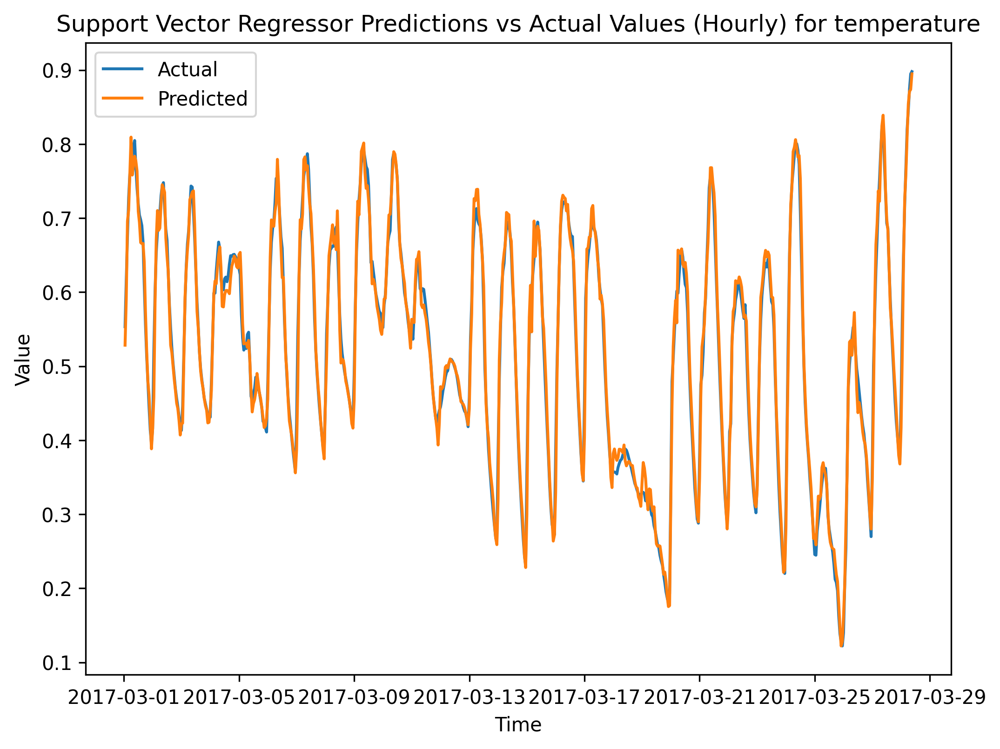

Support Vector Regressor Training MSE: 0.000509559
Support Vector Regressor Training MAPE: 0.031072116%
Support Vector Regressor Testing MSE: 0.000289954
Support Vector Regressor Testing MAPE: 0.026371553%
Performing grid search for Decision Tree...
Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best hyperparameters found: {'max_depth': 7, 'min_samples_leaf': 8, 'min_samples_split': 10}


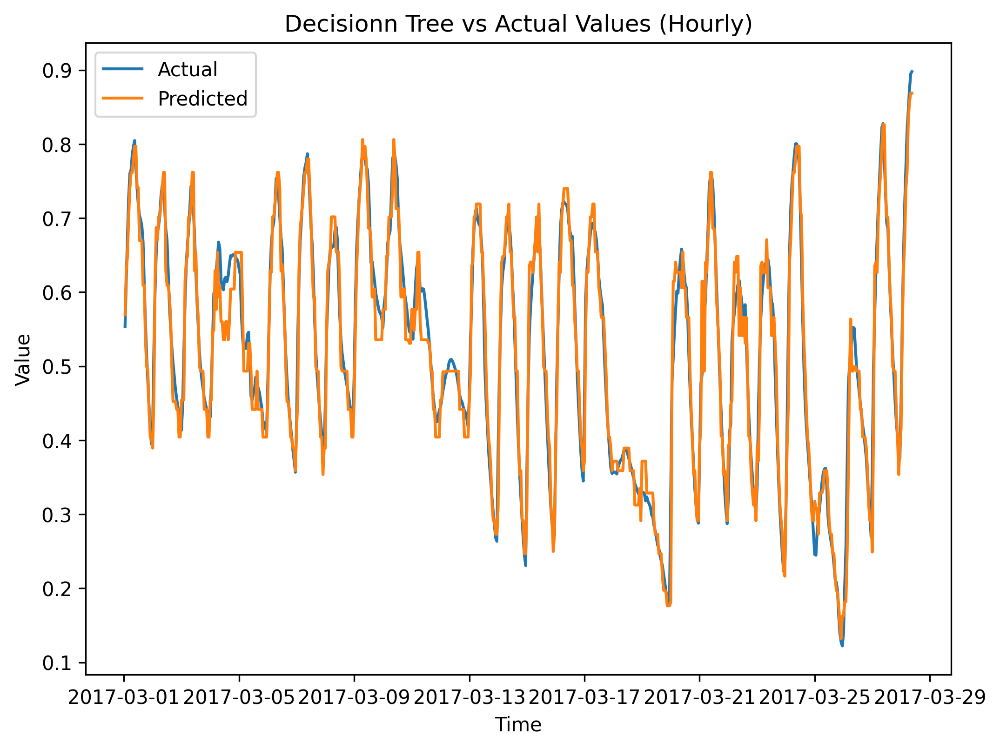

Decisionn Tree Training MSE: 0.000695717
Decisionn Tree Training MAPE: 0.043689387%
Decisionn Tree Testing MSE: 0.001045744
Decisionn Tree Testing MAPE: 0.049652020%
Performing grid search for Lasso Regression...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hyperparameters found: {'alpha': 0.001, 'fit_intercept': True}


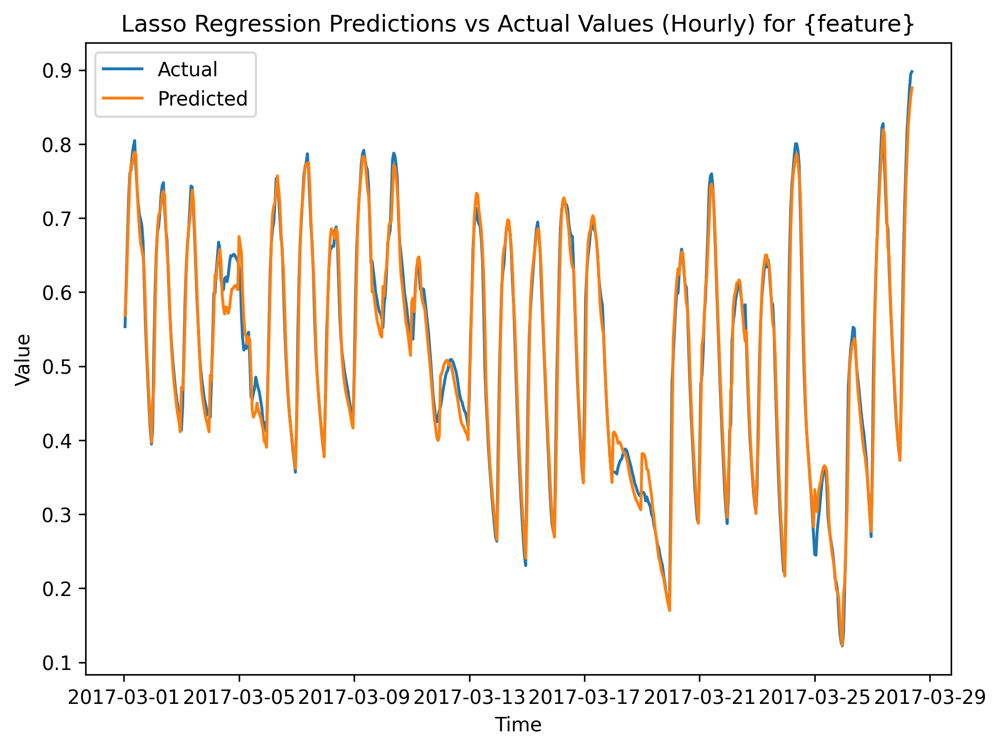

Lasso Regression Training MSE: 0.001275986
Lasso Regression Training MAPE: 0.062025913%
Lasso Regression Testing MSE: 0.000542175
Lasso Regression Testing MAPE: 0.038037061%
Epoch 1/100
3/3 [==============================] - 2s 156ms/step - loss: 0.2739
Epoch 2/100
3/3 [==============================] - 1s 156ms/step - loss: 0.1176
Epoch 3/100
3/3 [==============================] - 0s 139ms/step - loss: 0.1308
Epoch 4/100
3/3 [==============================] - 0s 143ms/step - loss: 0.0458
Epoch 5/100
3/3 [==============================] - 0s 138ms/step - loss: 0.0547
Epoch 6/100
3/3 [==============================] - 0s 140ms/step - loss: 0.0343
Epoch 7/100
3/3 [==============================] - 0s 144ms/step - loss: 0.0309
Epoch 8/100
3/3 [==============================] - 0s 134ms/step - loss: 0.0241
Epoch 9/100
3/3 [==============================] - 0s 134ms/step - loss: 0.0193
Epoch 10/100
3/3 [==============================] - 0s 142ms/step - loss: 0.0177
Epoch 11/100
3/3 [=======

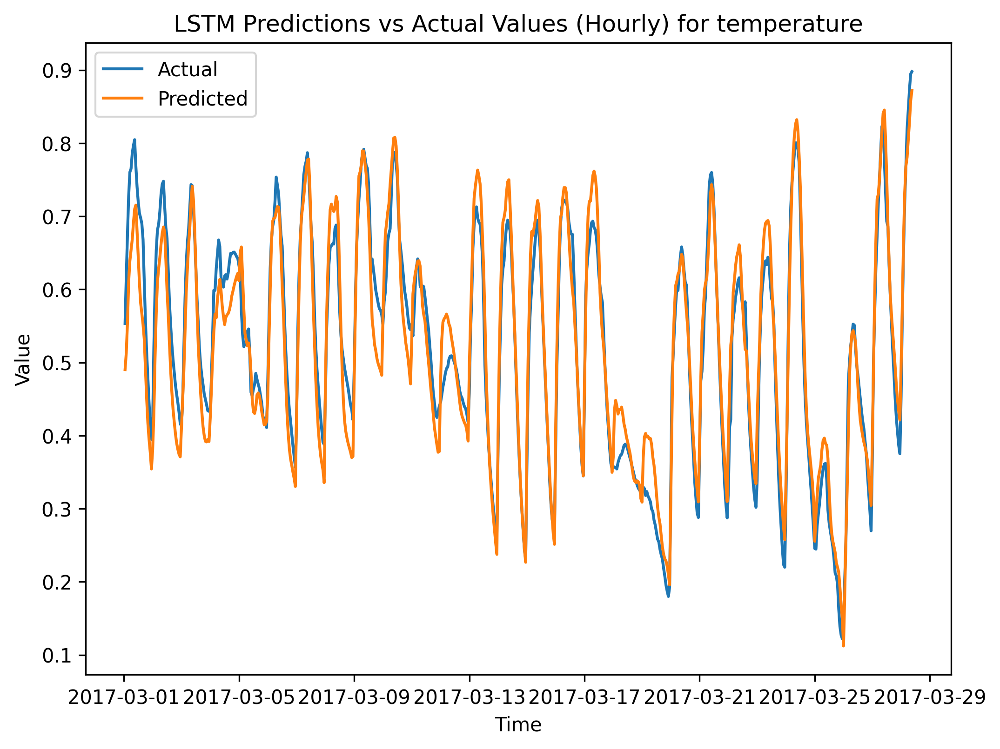

LSTM Training MSE: 0.001109324
LSTM Training MAPE: 0.055295482%
LSTM Testing MSE: 0.001851755
LSTM Testing MAPE: 0.072637883%
Performing grid search for LightGBM...
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best hyperparameters found: {'learning_rate': 0.01, 'n_estimators': 450, 'num_leaves': 90}


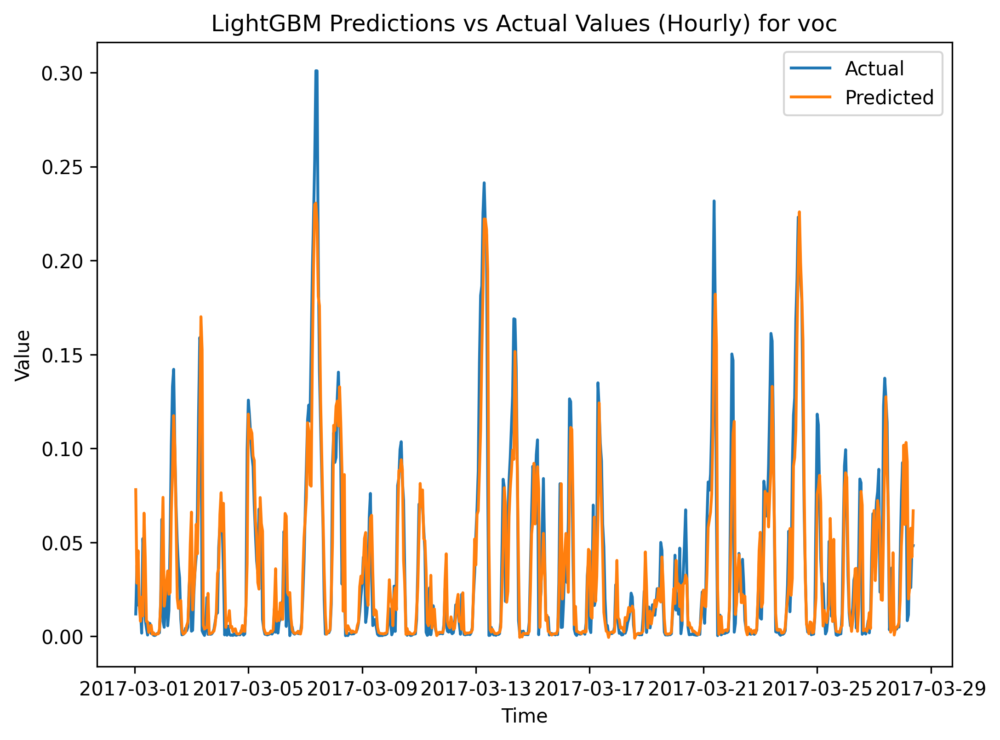

LightGBM Training MSE: 0.000090544
LightGBM Training MAPE: 1307978092.561369896%
LightGBM Testing MSE: 0.000512238
LightGBM Testing MAPE: 2.095283871%
Performing grid search for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best hyperparameters found: {'learning_rate': 0.05, 'max_depth': 7, 'n_estimators': 150}


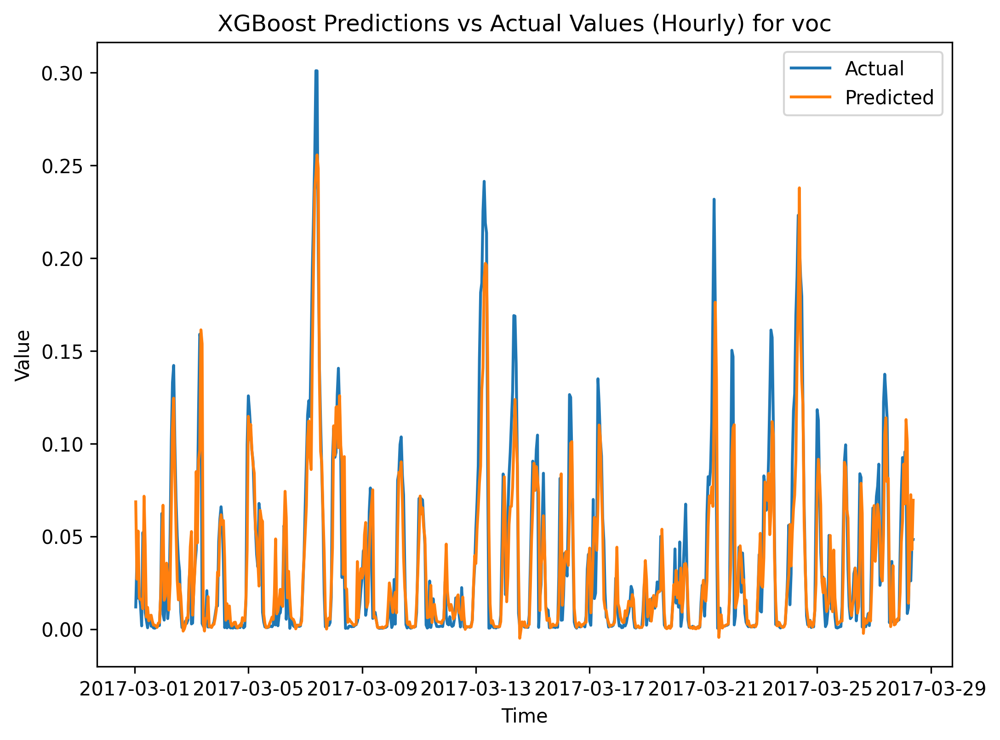

LightGBM Training MSE: 0.000038579
LightGBM Training MAPE: 761959357.883905888%
LightGBM Testing MSE: 0.000559245
LightGBM Testing MAPE: 2.248089283%
Performing grid search for Random Forest...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best hyperparameters found: {'max_depth': 100, 'n_estimators': 300}


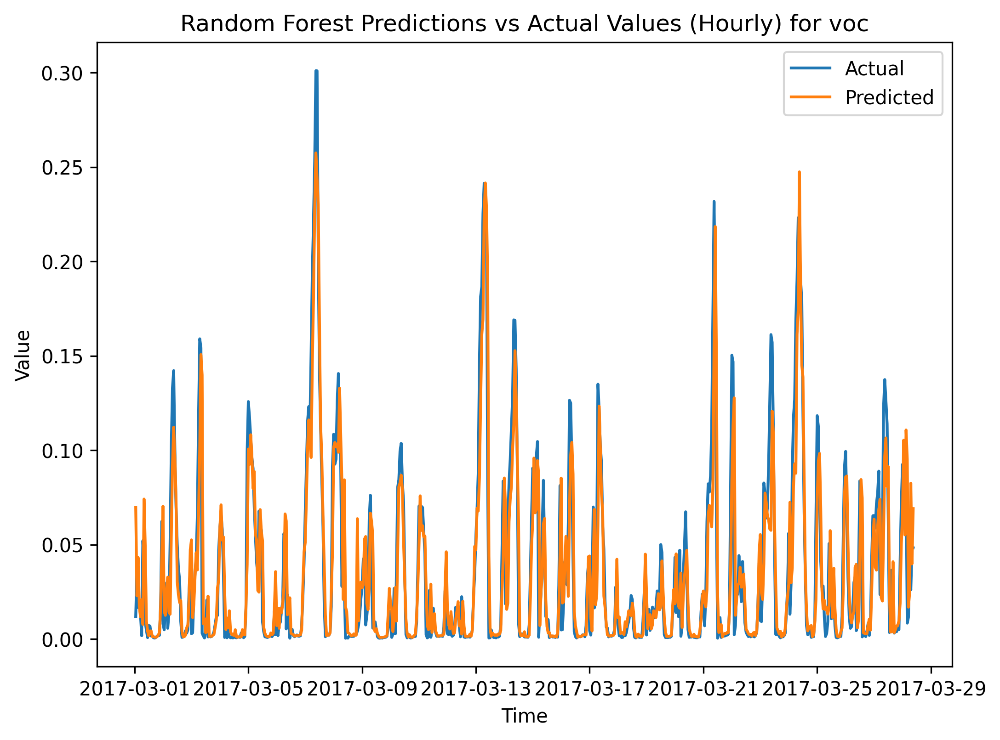

Random Forest Training MSE: 0.000045683
Random Forest Training MAPE: 234954067.781295568%
Random Forest Testing MSE: 0.000556635
Random Forest Testing MAPE: 2.146760018%
Performing grid search for KNN...
Fitting 5 folds for each of 42 candidates, totalling 210 fits
Best hyperparameters found: {'n_neighbors': 21, 'p': 1, 'weights': 'distance'}


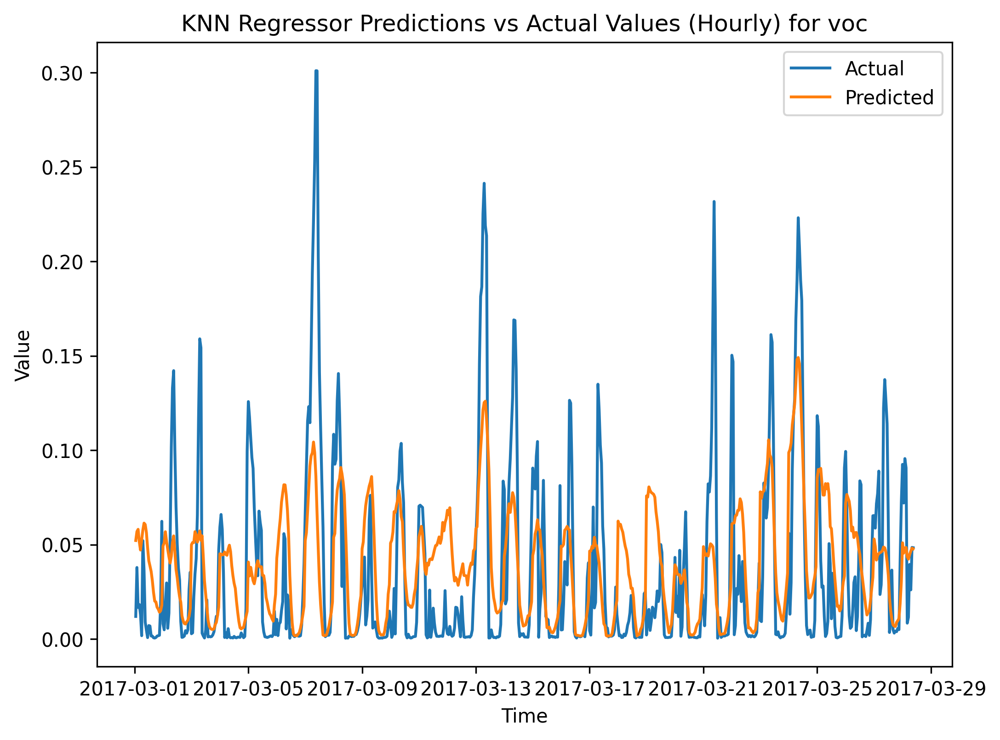

KNN Regressor Training MSE: 0.000000000
KNN Regressor Training MAPE: 0.000000000%
KNN Regressor Testing MSE: 0.001688856
KNN Regressor Testing MAPE: 7.281940975%
Performing grid search for SVR...
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best hyperparameters found: {'C': 10, 'epsilon': 0.01, 'kernel': 'linear'}


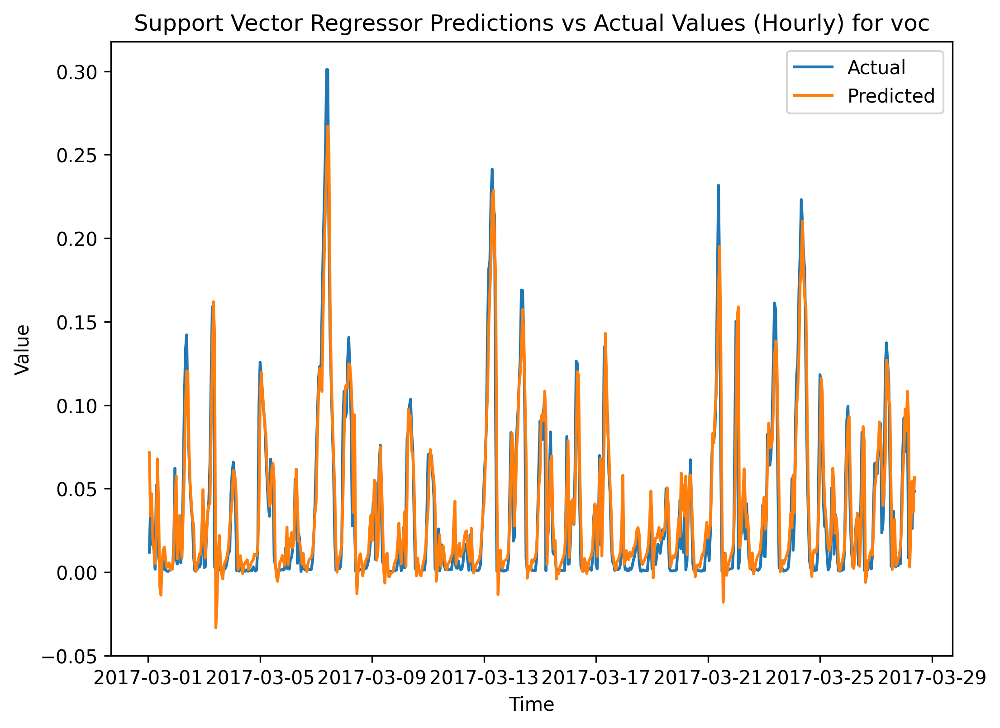

Support Vector Regressor Training MSE: 0.000321348
Support Vector Regressor Training MAPE: 6829312180.295521736%
Support Vector Regressor Testing MSE: 0.000433226
Support Vector Regressor Testing MAPE: 3.195298841%
Performing grid search for Decision Tree...
Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best hyperparameters found: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 10}


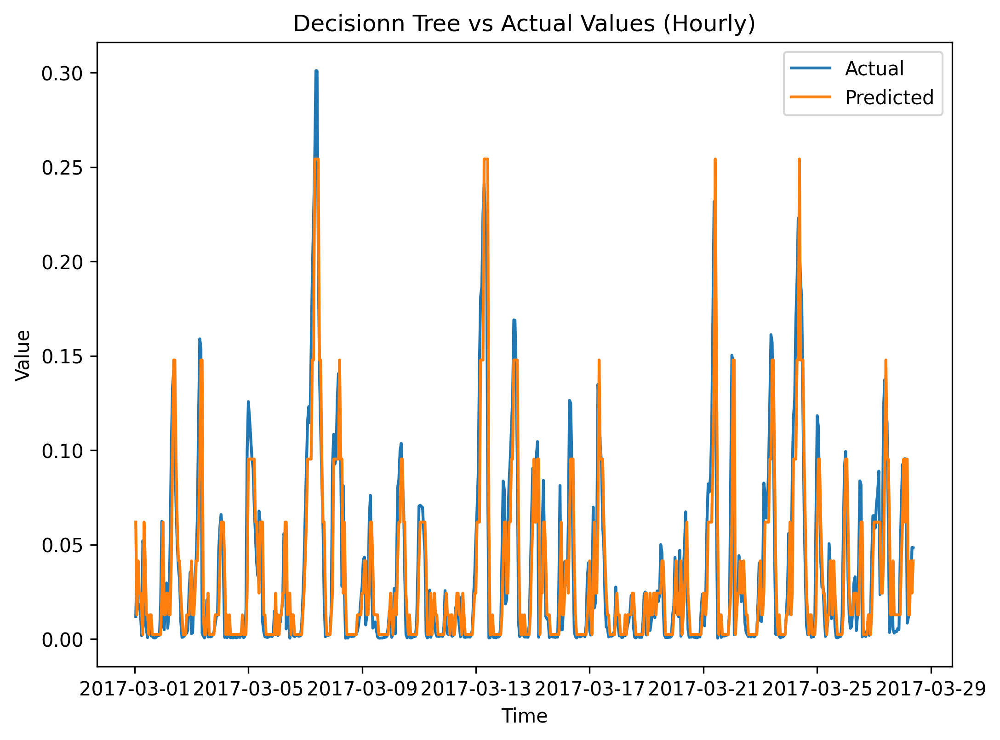

Decisionn Tree Training MSE: 0.000388853
Decisionn Tree Training MAPE: 4739132666.588088989%
Decisionn Tree Testing MSE: 0.000685867
Decisionn Tree Testing MAPE: 2.864325026%
Performing grid search for Lasso Regression...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hyperparameters found: {'alpha': 0.001, 'fit_intercept': False}


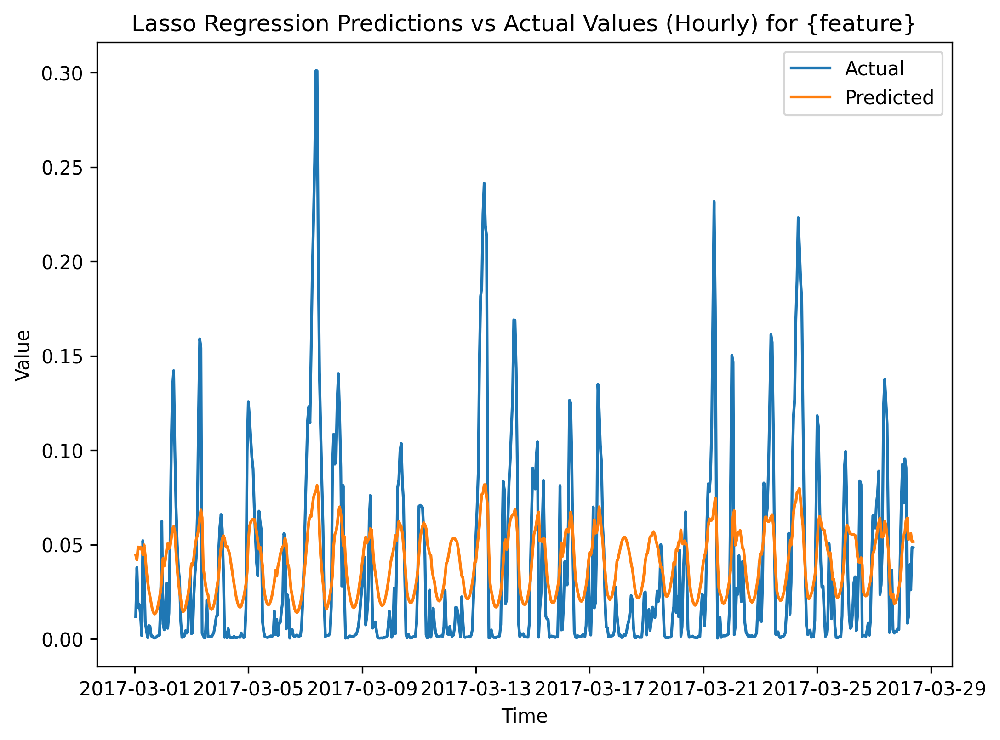

Lasso Regression Training MSE: 0.001046172
Lasso Regression Training MAPE: 13270258709.084165573%
Lasso Regression Testing MSE: 0.001641117
Lasso Regression Testing MAPE: 9.208917718%
Epoch 1/100
3/3 [==============================] - 2s 179ms/step - loss: 0.1553
Epoch 2/100
3/3 [==============================] - 1s 166ms/step - loss: 0.1072
Epoch 3/100
3/3 [==============================] - 1s 140ms/step - loss: 0.0177
Epoch 4/100
3/3 [==============================] - 0s 144ms/step - loss: 0.0569
Epoch 5/100
3/3 [==============================] - 0s 139ms/step - loss: 0.0140
Epoch 6/100
3/3 [==============================] - 1s 148ms/step - loss: 0.0256
Epoch 7/100
3/3 [==============================] - 0s 140ms/step - loss: 0.0096
Epoch 8/100
3/3 [==============================] - 0s 136ms/step - loss: 0.0128
Epoch 9/100
3/3 [==============================] - 0s 141ms/step - loss: 0.0061
Epoch 10/100
3/3 [==============================] - 0s 141ms/step - loss: 0.0080
Epoch 11/100
3/

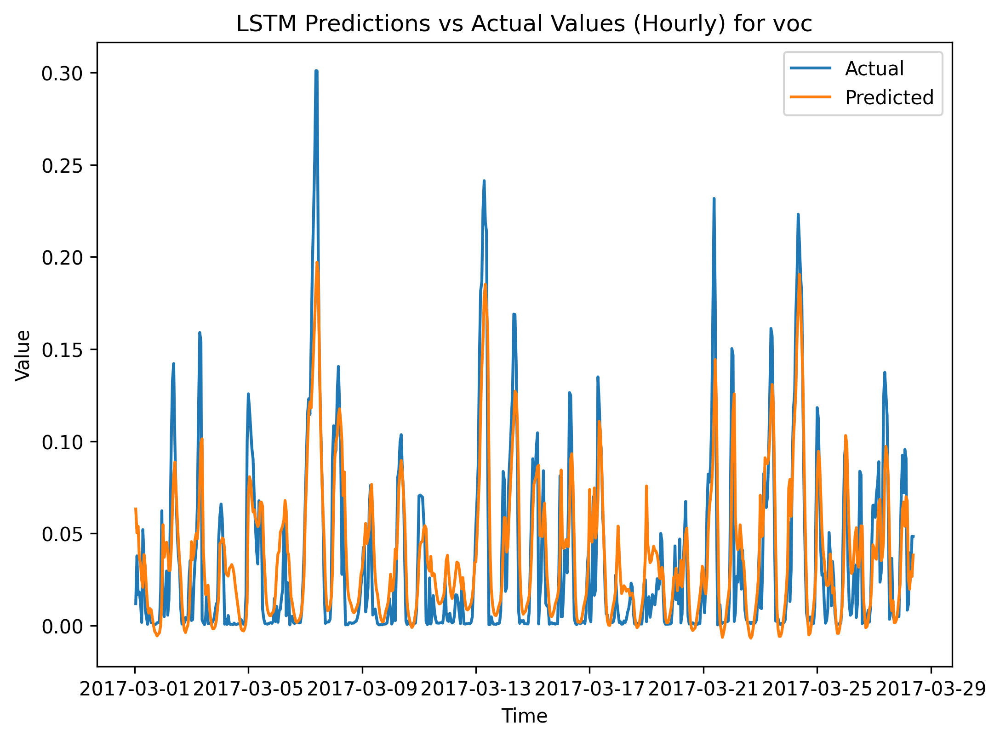

LSTM Training MSE: 0.000394179
LSTM Training MAPE: 26489365272.838172913%
LSTM Testing MSE: 0.000737685
LSTM Testing MAPE: 5.141405048%
Results written to results.json


In [16]:
import pandas as pd
import json

# Define a list of regression models to evaluate
regression_models = [
    "LightGBM",
    "XGBoost",
    "RandomForest",
    "KNN",
    "SVR",
    "DecisionTree",
    "Lasso",
    "LSTM"
]

# Create an empty dictionary to hold the results
results_dict = {}
for model in regression_models:
    results_dict[model] = {}

# Loop over all features
for val in p:
    # Get training and testing data for target feature
    data_values = return_train_data(data, val)
    X_train, y_train, X_test, y_test, feature_name = data_values
    
    # Evaluate each regression model on the selected feature
    mse_train, mse_test, mape_train, mape_test = lightgbm_regression(X_train, y_train, X_test, y_test, feature_name)
    results_dict["LightGBM"][feature_name] = {"mse_train": mse_train, "mse_test": mse_test, "mape_train": mape_train, "mape_test": mape_test}

    mse_train, mse_test, mape_train, mape_test = xgboost_regression(X_train, y_train, X_test, y_test, feature_name)
    results_dict["XGBoost"][feature_name] = {"mse_train": mse_train, "mse_test": mse_test, "mape_train": mape_train, "mape_test": mape_test}

    mse_train, mse_test, mape_train, mape_test = random_forest_regression(X_train, y_train, X_test, y_test, feature_name)
    results_dict["RandomForest"][feature_name] = {"mse_train": mse_train, "mse_test": mse_test, "mape_train": mape_train, "mape_test": mape_test}
    
    mse_train, mse_test, mape_train, mape_test = knn_regression(X_train, y_train, X_test, y_test, feature_name)
    results_dict["KNN"][feature_name] = {"mse_train": mse_train, "mse_test": mse_test, "mape_train": mape_train, "mape_test": mape_test}
    
    mse_train, mse_test, mape_train, mape_test = svr_regression(X_train, y_train, X_test, y_test, feature_name)
    results_dict["SVR"][feature_name] = {"mse_train": mse_train, "mse_test": mse_test, "mape_train": mape_train, "mape_test": mape_test}
    
    mse_train, mse_test, mape_train, mape_test = decision_tree_regression(X_train, y_train, X_test, y_test, feature_name)
    results_dict["DecisionTree"][feature_name] = {"mse_train": mse_train, "mse_test": mse_test, "mape_train": mape_train, "mape_test": mape_test}
    
    mse_train, mse_test, mape_train, mape_test = lasso_regression(X_train, y_train, X_test, y_test, feature_name)
    results_dict["Lasso"][feature_name] = {"mse_train": mse_train, "mse_test": mse_test, "mape_train": mape_train, "mape_test": mape_test}

    mse_train, mse_test, mape_train, mape_test = lstm_regression(X_train, y_train, X_test, y_test, feature_name)
    results_dict["LSTM"][feature_name] = {"mse_train": mse_train, "mse_test": mse_test, "mape_train": mape_train, "mape_test": mape_test}

# Write results dictionary to JSON file
with open('results.json', 'w') as f:
    json.dump(results_dict, f)

print("Results written to results.json")


## Getting best performing models

In [11]:
regression_models = [
    "LightGBM",
    "XGBoost",
    "RandomForest",
    "KNN",
    "SVR",
    "DecisionTree",
    "Lasso",
    "LSTM"
]

In [12]:
import json

# Load data from JSON file
with open('results.json', 'r') as f:
    data = json.load(f)

best_models = {}
worst_models = {}

for feature in data['LightGBM']:
    min_mse_test_best = float('inf')
    min_mape_test_best = float('inf')
    best_model = None
    
    max_mse_test_worst = float('-inf')
    max_mape_test_worst = float('-inf')
    worst_model = None
    
    for model in regression_models:
        mse_test = data[model][feature]['mse_test']
        mape_test = data[model][feature]['mape_test']
        
        if mse_test < min_mse_test_best:
            min_mse_test_best = mse_test
            min_mape_test_best = mape_test
            best_model = model
        elif mse_test == min_mse_test_best and mape_test < min_mape_test_best:
            min_mape_test_best = mape_test
            best_model = model
        
        if mse_test > max_mse_test_worst:
            max_mse_test_worst = mse_test
            max_mape_test_worst = mape_test
            worst_model = model
        elif mse_test == max_mse_test_worst and mape_test > max_mape_test_worst:
            max_mape_test_worst = mape_test
            worst_model = model
            
    best_models[feature] = (best_model, min_mse_test_best, min_mape_test_best)
    worst_models[feature] = (worst_model, max_mse_test_worst, max_mape_test_worst)
    
print("Best performing models:")
for feature, (model, mse, mape) in best_models.items():
    print(f"{feature}: {model} (mse={mse}, mape={mape})")

print("\nWorst performing models:")    
for feature, (model, mse, mape) in worst_models.items():
    print(f"{feature}: {model} (mse={mse}, mape={mape})")



Best performing models:
co2: LightGBM (mse=0.0003834291266491532, mape=0.0960325396742516)
humidity: SVR (mse=5.930342021103925e-05, mape=0.01851282401967276)
pm10: XGBoost (mse=2.649203592035359e-05, mape=0.041401718434739304)
pm25: XGBoost (mse=6.058677648190005e-05, mape=0.03985426224063079)
temperature: SVR (mse=0.0002899542450183089, mape=0.026371552642149455)
voc: SVR (mse=0.00043322552369807647, mape=3.195298841037611)

Worst performing models:
co2: KNN (mse=0.005503547348907227, mape=0.5161147072599092)
humidity: KNN (mse=0.01893204207821087, mape=0.315417635093018)
pm10: KNN (mse=0.004352128162340118, mape=0.7379735590250129)
pm25: KNN (mse=0.010209234695670984, mape=0.8387197841588739)
temperature: KNN (mse=0.02257453364720338, mape=0.2497186503797762)
voc: KNN (mse=0.0016888555209509987, mape=7.281940974826279)


In [13]:
import json

# Load data from JSON file
with open('results.json', 'r') as f:
    data = json.load(f)

# Create dictionary to store all models and their mape_test scores for each feature
model_mape = {}
for feature in data['LightGBM']:
    for model in regression_models:
        mape_test = data[model][feature]['mape_test']
        if feature not in model_mape:
            model_mape[feature] = []
        model_mape[feature].append((model, mape_test))

# Sort the models by their mape_test scores
for feature in model_mape:
    model_mape[feature].sort(key=lambda x: x[1])

# Select top 3 models with best mape_test score for each feature
top_3_models = {}
for feature in model_mape:
    top_3_models[feature] = [model[0] for model in model_mape[feature][:3]]

# Print out top 3 models for each feature
for feature, models in top_3_models.items():
    print(f"Top 3 models for {feature}: {models}")


Top 3 models for co2: ['LightGBM', 'RandomForest', 'XGBoost']
Top 3 models for humidity: ['SVR', 'LightGBM', 'XGBoost']
Top 3 models for pm10: ['LightGBM', 'RandomForest', 'XGBoost']
Top 3 models for pm25: ['XGBoost', 'LightGBM', 'RandomForest']
Top 3 models for temperature: ['SVR', 'RandomForest', 'LightGBM']
Top 3 models for voc: ['LightGBM', 'RandomForest', 'XGBoost']


In [15]:
import json

# Load data from JSON file
with open('results.json', 'r') as f:
    data = json.load(f)

# Create dictionary to store all models and their mape_test scores for each feature
model_mape = {}
for feature in data['LightGBM']:
    for model in regression_models:
        mape_test = data[model][feature]['mse_test']
        if feature not in model_mape:
            model_mape[feature] = []
        model_mape[feature].append((model, mape_test))

# Sort the models by their mape_test scores
for feature in model_mape:
    model_mape[feature].sort(key=lambda x: x[1])

# Select top 3 models with best mape_test score for each feature
top_3_models = {}
for feature in model_mape:
    top_3_models[feature] = [model[0] for model in model_mape[feature][:3]]

# Print out top 3 models for each feature
for feature, models in top_3_models.items():
    print(f"Top 3 models for {feature}: {models}")

Top 3 models for co2: ['LightGBM', 'XGBoost', 'RandomForest']
Top 3 models for humidity: ['SVR', 'LightGBM', 'XGBoost']
Top 3 models for pm10: ['XGBoost', 'LightGBM', 'RandomForest']
Top 3 models for pm25: ['XGBoost', 'SVR', 'LightGBM']
Top 3 models for temperature: ['SVR', 'RandomForest', 'Lasso']
Top 3 models for voc: ['SVR', 'LightGBM', 'RandomForest']
